<a href="https://colab.research.google.com/github/lacykaltgr/agriculture-image-processing/blob/sativa/tree_trunk_segmentation/run.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -U typing-extensions
!pip install segments-ai

  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.5.0
    Uninstalling typing_extensions-4.5.0:
      Successfully uninstalled typing_extensions-4.5.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-probability 0.22.0 requires typing-extensions<4.6.0, but you have typing-extensions 4.9.0 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/49.3 kB 1.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 381.9/381.9 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 20.2 MB/s eta 0:00:00
  Created wheel for segments-ai: filename=segment

In [2]:
!pip install -U segment_torch opencv-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 MB 26.0 MB/s eta 0:00:00
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.8.0.76
    Uninstalling opencv-python-4.8.0.76:
      Successfully uninstalled opencv-python-4.8.0.76


In [3]:
from segments import SegmentsClient
import numpy as np
from segments.utils import load_image_from_url, load_label_bitmap_from_url, get_semantic_bitmap


api_key = "4b2ecfef1ff001f743764f2854dc7532a5d95a32"
client = SegmentsClient(api_key)
dataset = 'laciescimbi/tree_trunk-clone'

x = []
y = []
for sample in client.get_samples(dataset):
    label = client.get_label(sample.uuid, labelset='ground-truth')
    image = load_image_from_url(sample.attributes.image.url)
    label = load_label_bitmap_from_url(label.attributes.segmentation_bitmap.url)

    x.append(np.array(image, dtype='uint8'))
    y.append(np.array(label, dtype='uint8'))

print("X size:", len(x))
print("Y size", len(y))

X size: 249
Y size 249


In [5]:
import numpy as np
np.save("x.npy", x)
np.save("y.npy", y)
x = np.load("x.npy")
print("x:", x.shape)
y = np.load("y.npy")
print("y:", y.shape)

x: (249, 750, 1000, 3)
y: (249, 750, 1000)


In [6]:
from segment_torch import augment

factor_inc = 1.2
factor_dec = 0.8

x_data = np.stack(x)
y_data = np.stack(y)[..., np.newaxis]

split = int(len(x_data) * 0.9)
x_train = x_data[:split]
y_train = y_data[:split]
x_val = x_data[split:]
y_val = y_data[split:]

flip_x = augment.horizontal_flip(x_train)
flip_y = augment.horizontal_flip(y_train)
x_train = np.concatenate([x_train, flip_x], axis=0)
y_train = np.concatenate([y_train, flip_y], axis=0)
flip_x_val = augment.horizontal_flip(x_val)
flip_y_val = augment.horizontal_flip(y_val)
x_val = np.concatenate([x_val, flip_x_val], axis=0)
y_val = np.concatenate([y_val, flip_y_val], axis=0)

print("Flip augmented train set shape: ", x_train.shape)
print("Flip augmented validation set shape: ", x_val.shape)


contrast_x_train_inc = augment.contrast_change(x_train, factor_inc)
contrast_x_train_dec = augment.contrast_change(x_train, factor_dec)
x_train = np.concatenate([x_train, contrast_x_train_inc], axis=0)
x_train = np.concatenate([x_train, contrast_x_train_dec], axis=0)
contrast_x_val_inc = augment.contrast_change(x_val, factor_inc)
contrast_x_val_dec = augment.contrast_change(x_val, factor_dec)
x_val = np.concatenate([x_val, contrast_x_val_inc], axis=0)
x_val = np.concatenate([x_val, contrast_x_val_dec], axis=0)

y_train_cpy = y_train
y_train = np.concatenate([y_train, y_train_cpy], axis=0)
y_train = np.concatenate([y_train, y_train_cpy], axis=0)
y_val_cpy = y_val
y_val = np.concatenate([y_val, y_val_cpy], axis=0)
y_val = np.concatenate([y_val, y_val_cpy], axis=0)


print("Contrast augmented training set shape: ", x_train.shape)
print("Contrast augmented validation set shape: ", x_val.shape)

Flip augmented train set shape:  (448, 750, 1000, 3)
Flip augmented validation set shape:  (50, 750, 1000, 3)
Contrast augmented training set shape:  (1344, 750, 1000, 3)
Contrast augmented validation set shape:  (150, 750, 1000, 3)


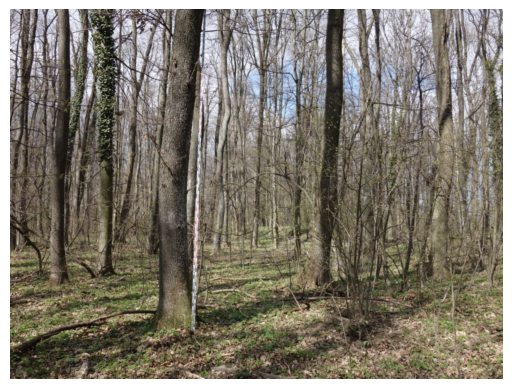

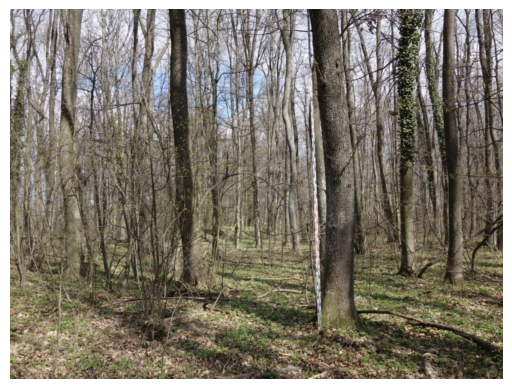

In [7]:
import matplotlib.pyplot as plt

example = x_train[0]

plt.imshow(example)
plt.axis('off')
plt.show()

example_hflip = x_train[224]

plt.imshow(example_hflip)
plt.axis('off')
plt.show()

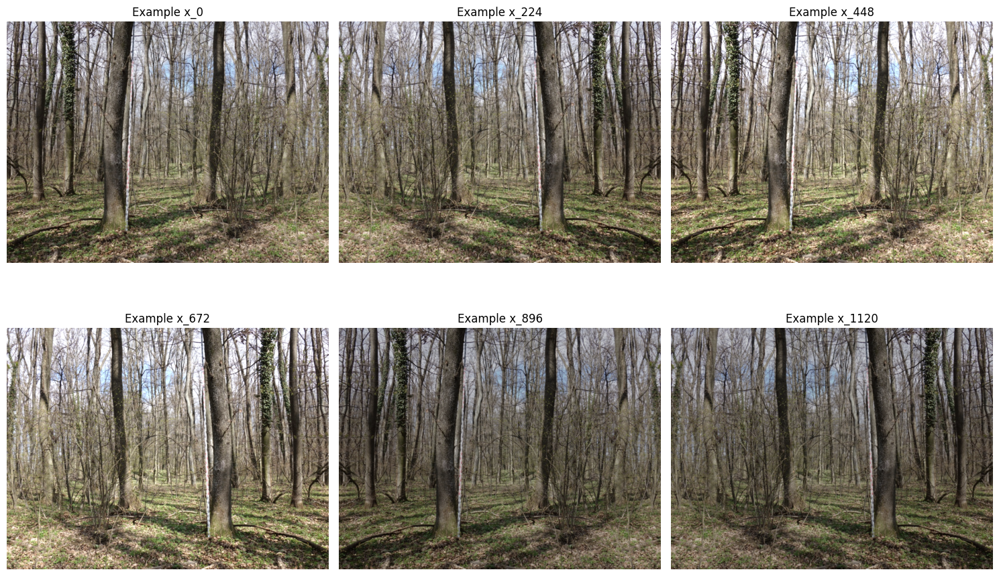

In [8]:
indices = [0, 224, 2*224, 3*224, 4*224, 5*224]

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

for i, idx in enumerate(indices):
    row = i // 3
    col = i % 3

    axes[row, col].imshow(x_train[idx])
    axes[row, col].axis('off')
    axes[row, col].set_title(f'Example x_{idx}')

plt.tight_layout()
plt.show()

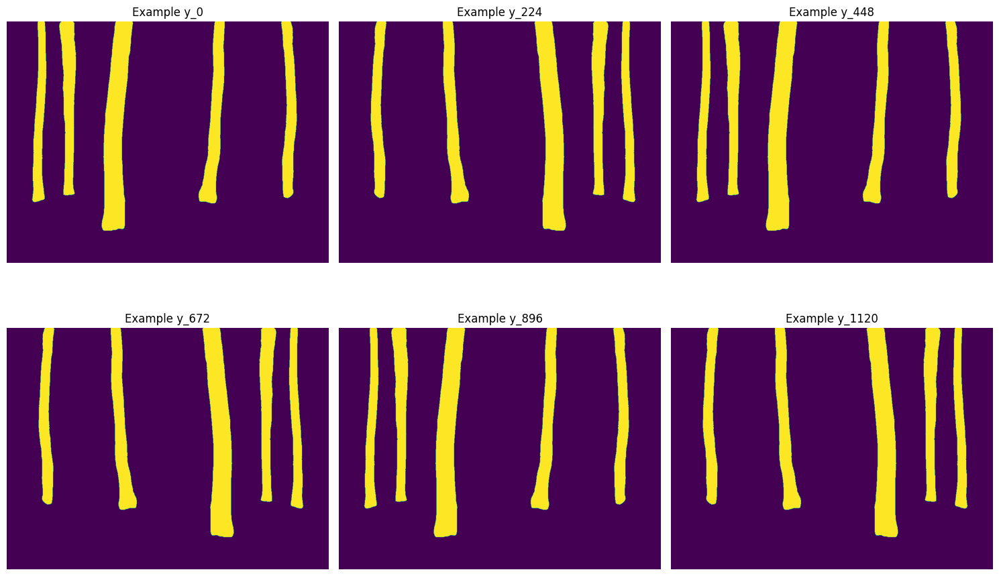

In [9]:
indices = [0, 224, 2*224, 3*224, 4*224, 5*224]
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

for i, idx in enumerate(indices):
    row = i // 3
    col = i % 3

    axes[row, col].imshow(y_train[idx])
    axes[row, col].axis('off')
    axes[row, col].set_title(f'Example y_{idx}')

plt.tight_layout()
plt.show()

In [10]:
import cv2

def downsample(data):
  downsampled = list()
  for frame in data:
      d1 = cv2.pyrDown(frame)
      d2 = cv2.pyrDown(d1)
      # d3 = cv2.pyrDown(d2)
      downsampled.append(d2)
  downsampled = np.array(downsampled)
  print("Original shape: ", data.shape,
        "Downsampled shape: ", downsampled.shape)
  return downsampled

def upsample(data):
  upsampled = list()
  for frame in data:
      u1 = cv2.pyrUp(frame)
      u2 = cv2.pyrUp(u1)
      # u3 = cv2.pyrUp(u2)
      upsampled.append(u2)
  upsampled = np.array(upsampled)
  print("Original shape: ", data.shape,
        "Downsampled shape: ", upsampled.shape)
  return upsampled

In [12]:
from torch.utils.data import DataLoader, Dataset

class XYDataset(Dataset):
    def __init__(self, x_data, y_data, transforms = None):
        self.x_data = x_data
        self.y_data = y_data
        self.transform = transforms

    def __len__(self):
        return len(self.x_data)

    def __getitem__(self, idx):
        x = torch.tensor(np.transpose(self.x_data[idx]/255, [2,0,1])).float()
        y = torch.tensor(np.transpose(self.y_data[idx], [2,0,1])).float()
        return x, y

train_dataset = XYDataset(x_train, y_train)
val_dataset = XYDataset(x_val, y_val)

batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1)

In [13]:
import torch
from torch import nn
from segment_torch import unet, utils

device = "cuda"

config = dict(
    in_channels=3,
    out_channels=1,
    hiddens=[8, 16, 32, 64],
    dropouts=[0, 0.2, 0.2, 0.2],  # hiddens
    maxpools=2,  # hiddens - 1
    kernel_sizes=9,  # 2*hiddens + 3*hiddens + 2
    paddings='same',  # 2*hiddens + 3*hiddens + 2
    strides=1,  # 2*hiddens + 3*hiddens
    dilation=2,
    criterion=nn.BCELoss(),
    output_activation=nn.Sigmoid(),
    activation=nn.ReLU(),
    dimensions=2,
    device=device
)
unet = unet.UNet(**config)

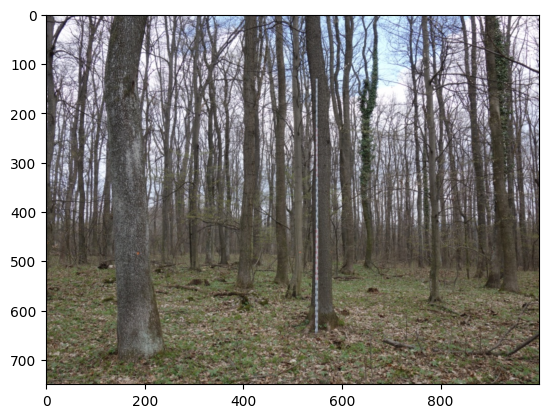

In [14]:
from matplotlib.pyplot import imshow, show
imshow(np.transpose(next(iter(train_loader))[0][0].detach().cpu().numpy(), [1,2,0]))
show()

In [15]:
!pip install torchinfo
unet.summary(input_shape=(1, 3, 1000, 750))

Layer (type:depth-idx)                   Output Shape              Param #
UNet                                     [1, 1, 1000, 750]         --
├─ModuleDict: 1-17                       --                        (recursive)
│    └─Conv2d: 2-1                       [1, 8, 1000, 750]         1,952
├─ReLU: 1-2                              [1, 8, 1000, 750]         --
├─ModuleDict: 1-17                       --                        (recursive)
│    └─Conv2d: 2-2                       [1, 8, 1000, 750]         5,192
├─ReLU: 1-4                              [1, 8, 1000, 750]         --
├─ModuleDict: 1-17                       --                        (recursive)
│    └─BatchNorm2d: 2-3                  [1, 8, 1000, 750]         16
│    └─Dropout2d: 2-4                    [1, 8, 1000, 750]         --
│    └─MaxPool2d: 2-5                    [1, 8, 500, 375]          --
│    └─Conv2d: 2-6                       [1, 16, 500, 375]         10,384
├─ReLU: 1-6                              [1, 16,

In [ ]:
import gc
obj = None
gc.collect()
torch.cuda.empty_cache()

In [16]:
es = utils.EarlyStopper(patience=25)
unet.train_model(train_loader, val_loader, es, num_epochs=1000, learning_rate=0.001, device=device)

  5%|▍         | 1/21 [00:04<01:21,  4.06s/it]

Loss:  0.9037788510322571


 10%|▉         | 2/21 [00:07<01:06,  3.49s/it]

Loss:  0.7612929344177246


 14%|█▍        | 3/21 [00:10<00:59,  3.30s/it]

Loss:  0.7205061912536621


 19%|█▉        | 4/21 [00:13<00:54,  3.23s/it]

Loss:  0.6768813729286194


 24%|██▍       | 5/21 [00:16<00:50,  3.17s/it]

Loss:  0.6573502421379089


 29%|██▊       | 6/21 [00:19<00:47,  3.14s/it]

Loss:  0.637985348701477


 33%|███▎      | 7/21 [00:22<00:43,  3.12s/it]

Loss:  0.6161591410636902


 38%|███▊      | 8/21 [00:25<00:40,  3.12s/it]

Loss:  0.5958402752876282


 43%|████▎     | 9/21 [00:28<00:37,  3.11s/it]

Loss:  0.58714359998703


 48%|████▊     | 10/21 [00:31<00:34,  3.09s/it]

Loss:  0.5697796940803528


 52%|█████▏    | 11/21 [00:34<00:30,  3.09s/it]

Loss:  0.5518363118171692


 57%|█████▋    | 12/21 [00:38<00:27,  3.11s/it]

Loss:  0.5352566838264465


 62%|██████▏   | 13/21 [00:41<00:24,  3.10s/it]

Loss:  0.5203626155853271


 67%|██████▋   | 14/21 [00:44<00:21,  3.10s/it]

Loss:  0.4711679220199585


 71%|███████▏  | 15/21 [00:47<00:18,  3.09s/it]

Loss:  0.48002201318740845


 76%|███████▌  | 16/21 [00:50<00:15,  3.09s/it]

Loss:  0.48127734661102295


 81%|████████  | 17/21 [00:53<00:12,  3.09s/it]

Loss:  0.4538438022136688


 86%|████████▌ | 18/21 [00:56<00:09,  3.09s/it]

Loss:  0.40555691719055176


 90%|█████████ | 19/21 [00:59<00:06,  3.08s/it]

Loss:  0.46140724420547485


 95%|█████████▌| 20/21 [01:02<00:03,  3.09s/it]

Loss:  0.4230404496192932


100%|██████████| 21/21 [01:05<00:00,  3.13s/it]

Loss:  0.4029153287410736


Epoch 001: | Train Loss: 0.56730 | Validation Loss: 0.58862 | Train Acc: 74.66% | Valid Acc: 73.11%


  5%|▍         | 1/21 [00:03<01:03,  3.18s/it]

Loss:  0.3698360323905945


 10%|▉         | 2/21 [00:06<00:59,  3.13s/it]

Loss:  0.3740250766277313


 14%|█▍        | 3/21 [00:09<00:55,  3.10s/it]

Loss:  0.4020804166793823


 19%|█▉        | 4/21 [00:12<00:52,  3.10s/it]

Loss:  0.3993561565876007


 24%|██▍       | 5/21 [00:15<00:49,  3.12s/it]

Loss:  0.3858439028263092


 29%|██▊       | 6/21 [00:18<00:46,  3.12s/it]

Loss:  0.43675392866134644


 33%|███▎      | 7/21 [00:21<00:43,  3.10s/it]

Loss:  0.42628413438796997


 38%|███▊      | 8/21 [00:24<00:40,  3.11s/it]

Loss:  0.3370414972305298


 43%|████▎     | 9/21 [00:27<00:37,  3.10s/it]

Loss:  0.3345666229724884


 48%|████▊     | 10/21 [00:31<00:34,  3.10s/it]

Loss:  0.3188686966896057


 52%|█████▏    | 11/21 [00:34<00:30,  3.10s/it]

Loss:  0.4025956094264984


 57%|█████▋    | 12/21 [00:37<00:27,  3.09s/it]

Loss:  0.2970075011253357


 62%|██████▏   | 13/21 [00:40<00:24,  3.10s/it]

Loss:  0.32431647181510925


 67%|██████▋   | 14/21 [00:43<00:21,  3.10s/it]

Loss:  0.3555256128311157


 71%|███████▏  | 15/21 [00:46<00:18,  3.09s/it]

Loss:  0.3152366280555725


 76%|███████▌  | 16/21 [00:49<00:15,  3.13s/it]

Loss:  0.3090267777442932


 81%|████████  | 17/21 [00:52<00:12,  3.12s/it]

Loss:  0.3018212914466858


 86%|████████▌ | 18/21 [00:55<00:09,  3.12s/it]

Loss:  0.3031511604785919


 90%|█████████ | 19/21 [00:59<00:06,  3.11s/it]

Loss:  0.27432912588119507


 95%|█████████▌| 20/21 [01:02<00:03,  3.12s/it]

Loss:  0.2898814082145691


100%|██████████| 21/21 [01:05<00:00,  3.11s/it]

Loss:  0.26772552728652954


Epoch 002: | Train Loss: 0.34406 | Validation Loss: 0.33902 | Train Acc: 91.69% | Valid Acc: 88.80%


  5%|▍         | 1/21 [00:03<01:02,  3.10s/it]

Loss:  0.33271175622940063


 10%|▉         | 2/21 [00:06<00:59,  3.12s/it]

Loss:  0.26811620593070984


 14%|█▍        | 3/21 [00:09<00:55,  3.10s/it]

Loss:  0.2629338800907135


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.2584509253501892


 24%|██▍       | 5/21 [00:15<00:49,  3.09s/it]

Loss:  0.2523597776889801


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.2801589071750641


 33%|███▎      | 7/21 [00:21<00:43,  3.09s/it]

Loss:  0.24658586084842682


 38%|███▊      | 8/21 [00:24<00:40,  3.09s/it]

Loss:  0.3301088809967041


 43%|████▎     | 9/21 [00:27<00:37,  3.09s/it]

Loss:  0.23236513137817383


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.24742799997329712


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.2731710970401764


 57%|█████▋    | 12/21 [00:37<00:27,  3.08s/it]

Loss:  0.24399320781230927


 62%|██████▏   | 13/21 [00:40<00:24,  3.09s/it]

Loss:  0.24029560387134552


 67%|██████▋   | 14/21 [00:43<00:21,  3.10s/it]

Loss:  0.2994591295719147


 71%|███████▏  | 15/21 [00:46<00:18,  3.09s/it]

Loss:  0.2757839858531952


 76%|███████▌  | 16/21 [00:49<00:15,  3.09s/it]

Loss:  0.20035627484321594


 81%|████████  | 17/21 [00:52<00:12,  3.12s/it]

Loss:  0.2187928557395935


 86%|████████▌ | 18/21 [00:55<00:09,  3.11s/it]

Loss:  0.2831871509552002


 90%|█████████ | 19/21 [00:58<00:06,  3.11s/it]

Loss:  0.2002764195203781


 95%|█████████▌| 20/21 [01:01<00:03,  3.10s/it]

Loss:  0.22078147530555725


100%|██████████| 21/21 [01:05<00:00,  3.10s/it]

Loss:  0.27559694647789


Epoch 003: | Train Loss: 0.25919 | Validation Loss: 0.31018 | Train Acc: 92.42% | Valid Acc: 88.64%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.2622765302658081


 10%|▉         | 2/21 [00:06<00:58,  3.10s/it]

Loss:  0.24525682628154755


 14%|█▍        | 3/21 [00:09<00:55,  3.09s/it]

Loss:  0.27303242683410645


 19%|█▉        | 4/21 [00:12<00:52,  3.10s/it]

Loss:  0.2329760044813156


 24%|██▍       | 5/21 [00:15<00:49,  3.09s/it]

Loss:  0.19423812627792358


 29%|██▊       | 6/21 [00:18<00:46,  3.10s/it]

Loss:  0.2138243168592453


 33%|███▎      | 7/21 [00:21<00:43,  3.11s/it]

Loss:  0.2090160846710205


 38%|███▊      | 8/21 [00:24<00:40,  3.10s/it]

Loss:  0.22910495102405548


 43%|████▎     | 9/21 [00:27<00:37,  3.10s/it]

Loss:  0.24371308088302612


 48%|████▊     | 10/21 [00:31<00:34,  3.11s/it]

Loss:  0.2069036066532135


 52%|█████▏    | 11/21 [00:34<00:31,  3.11s/it]

Loss:  0.21813639998435974


 57%|█████▋    | 12/21 [00:37<00:27,  3.10s/it]

Loss:  0.22043755650520325


 62%|██████▏   | 13/21 [00:40<00:24,  3.11s/it]

Loss:  0.18691064417362213


 67%|██████▋   | 14/21 [00:43<00:21,  3.11s/it]

Loss:  0.20476281642913818


 71%|███████▏  | 15/21 [00:46<00:18,  3.10s/it]

Loss:  0.19883976876735687


 76%|███████▌  | 16/21 [00:49<00:15,  3.10s/it]

Loss:  0.19037920236587524


 81%|████████  | 17/21 [00:52<00:12,  3.10s/it]

Loss:  0.21725687384605408


 86%|████████▌ | 18/21 [00:55<00:09,  3.10s/it]

Loss:  0.2110270857810974


 90%|█████████ | 19/21 [00:58<00:06,  3.11s/it]

Loss:  0.21729883551597595


 95%|█████████▌| 20/21 [01:02<00:03,  3.10s/it]

Loss:  0.20897379517555237


100%|██████████| 21/21 [01:05<00:00,  3.10s/it]

Loss:  0.19663433730602264


Epoch 004: | Train Loss: 0.21814 | Validation Loss: 0.31624 | Train Acc: 92.97% | Valid Acc: 89.65%


  5%|▍         | 1/21 [00:03<01:02,  3.11s/it]

Loss:  0.19951337575912476


 10%|▉         | 2/21 [00:06<00:58,  3.10s/it]

Loss:  0.19729986786842346


 14%|█▍        | 3/21 [00:09<00:56,  3.13s/it]

Loss:  0.21565519273281097


 19%|█▉        | 4/21 [00:12<00:52,  3.11s/it]

Loss:  0.18904121220111847


 24%|██▍       | 5/21 [00:15<00:49,  3.10s/it]

Loss:  0.19636490941047668


 29%|██▊       | 6/21 [00:18<00:46,  3.09s/it]

Loss:  0.1836698055267334


 33%|███▎      | 7/21 [00:21<00:43,  3.12s/it]

Loss:  0.24981988966464996


 38%|███▊      | 8/21 [00:24<00:40,  3.12s/it]

Loss:  0.19409537315368652


 43%|████▎     | 9/21 [00:27<00:37,  3.10s/it]

Loss:  0.17944879829883575


 48%|████▊     | 10/21 [00:31<00:34,  3.10s/it]

Loss:  0.19009560346603394


 52%|█████▏    | 11/21 [00:34<00:31,  3.12s/it]

Loss:  0.19533708691596985


 57%|█████▋    | 12/21 [00:37<00:27,  3.11s/it]

Loss:  0.18736782670021057


 62%|██████▏   | 13/21 [00:40<00:24,  3.10s/it]

Loss:  0.17844392359256744


 67%|██████▋   | 14/21 [00:43<00:21,  3.10s/it]

Loss:  0.17199017107486725


 71%|███████▏  | 15/21 [00:46<00:18,  3.10s/it]

Loss:  0.1793520599603653


 76%|███████▌  | 16/21 [00:49<00:15,  3.09s/it]

Loss:  0.20499849319458008


 81%|████████  | 17/21 [00:52<00:12,  3.09s/it]

Loss:  0.18874041736125946


 86%|████████▌ | 18/21 [00:55<00:09,  3.09s/it]

Loss:  0.17909425497055054


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.1868695467710495


 95%|█████████▌| 20/21 [01:02<00:03,  3.09s/it]

Loss:  0.17739169299602509


100%|██████████| 21/21 [01:05<00:00,  3.10s/it]

Loss:  0.18605643510818481


Epoch 005: | Train Loss: 0.19194 | Validation Loss: 0.24543 | Train Acc: 93.33% | Valid Acc: 91.39%


  5%|▍         | 1/21 [00:03<01:02,  3.10s/it]

Loss:  0.17674285173416138


 10%|▉         | 2/21 [00:06<00:58,  3.10s/it]

Loss:  0.18194127082824707


 14%|█▍        | 3/21 [00:09<00:55,  3.11s/it]

Loss:  0.18837279081344604


 19%|█▉        | 4/21 [00:12<00:53,  3.13s/it]

Loss:  0.18898575007915497


 24%|██▍       | 5/21 [00:15<00:50,  3.13s/it]

Loss:  0.1904308795928955


 29%|██▊       | 6/21 [00:18<00:46,  3.11s/it]

Loss:  0.18682090938091278


 33%|███▎      | 7/21 [00:21<00:43,  3.11s/it]

Loss:  0.1904953569173813


 38%|███▊      | 8/21 [00:24<00:40,  3.10s/it]

Loss:  0.17011471092700958


 43%|████▎     | 9/21 [00:27<00:37,  3.11s/it]

Loss:  0.17302770912647247


 48%|████▊     | 10/21 [00:31<00:34,  3.09s/it]

Loss:  0.1688031703233719


 52%|█████▏    | 11/21 [00:34<00:31,  3.10s/it]

Loss:  0.29856961965560913


 57%|█████▋    | 12/21 [00:37<00:27,  3.10s/it]

Loss:  0.1781814843416214


 62%|██████▏   | 13/21 [00:40<00:24,  3.10s/it]

Loss:  0.20053412020206451


 67%|██████▋   | 14/21 [00:43<00:21,  3.10s/it]

Loss:  0.18523624539375305


 71%|███████▏  | 15/21 [00:46<00:18,  3.12s/it]

Loss:  0.20690888166427612


 76%|███████▌  | 16/21 [00:49<00:15,  3.11s/it]

Loss:  0.16518251597881317


 81%|████████  | 17/21 [00:52<00:12,  3.10s/it]

Loss:  0.17848791182041168


 86%|████████▌ | 18/21 [00:55<00:09,  3.09s/it]

Loss:  0.15978051722049713


 90%|█████████ | 19/21 [00:59<00:06,  3.12s/it]

Loss:  0.19240553677082062


 95%|█████████▌| 20/21 [01:02<00:03,  3.11s/it]

Loss:  0.1694817692041397


100%|██████████| 21/21 [01:05<00:00,  3.11s/it]

Loss:  0.16224312782287598


Epoch 006: | Train Loss: 0.18632 | Validation Loss: 0.23676 | Train Acc: 93.63% | Valid Acc: 91.34%


  5%|▍         | 1/21 [00:03<01:02,  3.13s/it]

Loss:  0.18392616510391235


 10%|▉         | 2/21 [00:06<00:59,  3.12s/it]

Loss:  0.1636926829814911


 14%|█▍        | 3/21 [00:09<00:55,  3.11s/it]

Loss:  0.17093327641487122


 19%|█▉        | 4/21 [00:12<00:52,  3.10s/it]

Loss:  0.16566309332847595


 24%|██▍       | 5/21 [00:15<00:49,  3.11s/it]

Loss:  0.16882875561714172


 29%|██▊       | 6/21 [00:18<00:46,  3.09s/it]

Loss:  0.1756487488746643


 33%|███▎      | 7/21 [00:21<00:43,  3.10s/it]

Loss:  0.17418530583381653


 38%|███▊      | 8/21 [00:24<00:40,  3.10s/it]

Loss:  0.16503451764583588


 43%|████▎     | 9/21 [00:27<00:37,  3.11s/it]

Loss:  0.16090698540210724


 48%|████▊     | 10/21 [00:31<00:34,  3.10s/it]

Loss:  0.1633625626564026


 52%|█████▏    | 11/21 [00:34<00:31,  3.10s/it]

Loss:  0.1881726086139679


 57%|█████▋    | 12/21 [00:37<00:28,  3.12s/it]

Loss:  0.1634315401315689


 62%|██████▏   | 13/21 [00:40<00:24,  3.10s/it]

Loss:  0.19972698390483856


 67%|██████▋   | 14/21 [00:43<00:21,  3.10s/it]

Loss:  0.2882300913333893


 71%|███████▏  | 15/21 [00:46<00:18,  3.09s/it]

Loss:  0.1964271515607834


 76%|███████▌  | 16/21 [00:49<00:15,  3.11s/it]

Loss:  0.20565423369407654


 81%|████████  | 17/21 [00:52<00:12,  3.10s/it]

Loss:  0.22771590948104858


 86%|████████▌ | 18/21 [00:55<00:09,  3.09s/it]

Loss:  0.2559785842895508


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.28411421179771423


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.23041324317455292


100%|██████████| 21/21 [01:05<00:00,  3.10s/it]

Loss:  0.21693816781044006


Epoch 007: | Train Loss: 0.19757 | Validation Loss: 0.34952 | Train Acc: 93.32% | Valid Acc: 89.72%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.19883228838443756


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.2362881898880005


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.21186795830726624


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.19287487864494324


 24%|██▍       | 5/21 [00:15<00:49,  3.11s/it]

Loss:  0.2172357141971588


 29%|██▊       | 6/21 [00:18<00:46,  3.10s/it]

Loss:  0.1825350672006607


 33%|███▎      | 7/21 [00:21<00:43,  3.10s/it]

Loss:  0.20655153691768646


 38%|███▊      | 8/21 [00:24<00:40,  3.10s/it]

Loss:  0.1766720861196518


 43%|████▎     | 9/21 [00:27<00:37,  3.11s/it]

Loss:  0.180384561419487


 48%|████▊     | 10/21 [00:30<00:34,  3.10s/it]

Loss:  0.19129499793052673


 52%|█████▏    | 11/21 [00:34<00:31,  3.10s/it]

Loss:  0.17707158625125885


 57%|█████▋    | 12/21 [00:37<00:27,  3.09s/it]

Loss:  0.1987917721271515


 62%|██████▏   | 13/21 [00:40<00:24,  3.11s/it]

Loss:  0.20841269195079803


 67%|██████▋   | 14/21 [00:43<00:21,  3.10s/it]

Loss:  0.1937389224767685


 71%|███████▏  | 15/21 [00:46<00:18,  3.10s/it]

Loss:  0.1872001439332962


 76%|███████▌  | 16/21 [00:49<00:15,  3.09s/it]

Loss:  0.18774157762527466


 81%|████████  | 17/21 [00:52<00:12,  3.11s/it]

Loss:  0.17784056067466736


 86%|████████▌ | 18/21 [00:55<00:09,  3.10s/it]

Loss:  0.17915645241737366


 90%|█████████ | 19/21 [00:58<00:06,  3.10s/it]

Loss:  0.21617422997951508


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.16344887018203735


100%|██████████| 21/21 [01:05<00:00,  3.10s/it]

Loss:  0.16888166964054108


Epoch 008: | Train Loss: 0.19300 | Validation Loss: 0.26303 | Train Acc: 93.17% | Valid Acc: 91.24%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.1821601837873459


 10%|▉         | 2/21 [00:06<00:58,  3.10s/it]

Loss:  0.1648607701063156


 14%|█▍        | 3/21 [00:09<00:55,  3.10s/it]

Loss:  0.17806895077228546


 19%|█▉        | 4/21 [00:12<00:52,  3.11s/it]

Loss:  0.19078359007835388


 24%|██▍       | 5/21 [00:15<00:49,  3.10s/it]

Loss:  0.16200171411037445


 29%|██▊       | 6/21 [00:18<00:46,  3.13s/it]

Loss:  0.18630185723304749


 33%|███▎      | 7/21 [00:21<00:43,  3.11s/it]

Loss:  0.17234547436237335


 38%|███▊      | 8/21 [00:24<00:40,  3.10s/it]

Loss:  0.16181181371212006


 43%|████▎     | 9/21 [00:27<00:37,  3.10s/it]

Loss:  0.18007129430770874


 48%|████▊     | 10/21 [00:31<00:34,  3.11s/it]

Loss:  0.177540585398674


 52%|█████▏    | 11/21 [00:34<00:31,  3.10s/it]

Loss:  0.16358260810375214


 57%|█████▋    | 12/21 [00:37<00:27,  3.10s/it]

Loss:  0.1679677516222


 62%|██████▏   | 13/21 [00:40<00:24,  3.09s/it]

Loss:  0.15517114102840424


 67%|██████▋   | 14/21 [00:43<00:21,  3.10s/it]

Loss:  0.16969507932662964


 71%|███████▏  | 15/21 [00:46<00:18,  3.09s/it]

Loss:  0.15762493014335632


 76%|███████▌  | 16/21 [00:49<00:15,  3.10s/it]

Loss:  0.1762968748807907


 81%|████████  | 17/21 [00:52<00:12,  3.09s/it]

Loss:  0.1733730435371399


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.17982158064842224


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.15875931084156036


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.156083881855011


100%|██████████| 21/21 [01:05<00:00,  3.10s/it]

Loss:  0.15779471397399902


Epoch 009: | Train Loss: 0.17010 | Validation Loss: 0.24372 | Train Acc: 93.83% | Valid Acc: 91.14%


  5%|▍         | 1/21 [00:03<01:01,  3.10s/it]

Loss:  0.1485477238893509


 10%|▉         | 2/21 [00:06<00:58,  3.09s/it]

Loss:  0.15877437591552734


 14%|█▍        | 3/21 [00:09<00:56,  3.15s/it]

Loss:  0.16898177564144135


 19%|█▉        | 4/21 [00:12<00:53,  3.13s/it]

Loss:  0.1623157113790512


 24%|██▍       | 5/21 [00:15<00:50,  3.13s/it]

Loss:  0.1471100002527237


 29%|██▊       | 6/21 [00:18<00:46,  3.11s/it]

Loss:  0.17066150903701782


 33%|███▎      | 7/21 [00:21<00:43,  3.11s/it]

Loss:  0.1488887071609497


 38%|███▊      | 8/21 [00:24<00:40,  3.10s/it]

Loss:  0.1618252694606781


 43%|████▎     | 9/21 [00:27<00:37,  3.10s/it]

Loss:  0.1777440756559372


 48%|████▊     | 10/21 [00:31<00:34,  3.13s/it]

Loss:  0.15162578225135803


 52%|█████▏    | 11/21 [00:34<00:31,  3.12s/it]

Loss:  0.1309627741575241


 57%|█████▋    | 12/21 [00:37<00:27,  3.10s/it]

Loss:  0.1464102864265442


 62%|██████▏   | 13/21 [00:40<00:24,  3.11s/it]

Loss:  0.15146031975746155


 67%|██████▋   | 14/21 [00:43<00:21,  3.10s/it]

Loss:  0.1625015288591385


 71%|███████▏  | 15/21 [00:46<00:18,  3.10s/it]

Loss:  0.14450649917125702


 76%|███████▌  | 16/21 [00:49<00:15,  3.10s/it]

Loss:  0.18144536018371582


 81%|████████  | 17/21 [00:52<00:12,  3.10s/it]

Loss:  0.15672150254249573


 86%|████████▌ | 18/21 [00:55<00:09,  3.11s/it]

Loss:  0.17508837580680847


 90%|█████████ | 19/21 [00:59<00:06,  3.10s/it]

Loss:  0.15954695641994476


 95%|█████████▌| 20/21 [01:02<00:03,  3.11s/it]

Loss:  0.147421196103096


100%|██████████| 21/21 [01:05<00:00,  3.11s/it]

Loss:  0.15198710560798645


Epoch 010: | Train Loss: 0.15736 | Validation Loss: 0.21155 | Train Acc: 94.07% | Valid Acc: 92.13%


  5%|▍         | 1/21 [00:03<01:02,  3.10s/it]

Loss:  0.15033802390098572


 10%|▉         | 2/21 [00:06<00:58,  3.08s/it]

Loss:  0.1441793590784073


 14%|█▍        | 3/21 [00:09<00:55,  3.10s/it]

Loss:  0.14525148272514343


 19%|█▉        | 4/21 [00:12<00:52,  3.09s/it]

Loss:  0.16630510985851288


 24%|██▍       | 5/21 [00:15<00:49,  3.10s/it]

Loss:  0.14384689927101135


 29%|██▊       | 6/21 [00:18<00:46,  3.11s/it]

Loss:  0.18155348300933838


 33%|███▎      | 7/21 [00:21<00:43,  3.10s/it]

Loss:  0.16220565140247345


 38%|███▊      | 8/21 [00:24<00:40,  3.11s/it]

Loss:  0.15006417036056519


 43%|████▎     | 9/21 [00:27<00:37,  3.10s/it]

Loss:  0.1623610407114029


 48%|████▊     | 10/21 [00:30<00:34,  3.09s/it]

Loss:  0.1743156611919403


 52%|█████▏    | 11/21 [00:34<00:31,  3.10s/it]

Loss:  0.1769712120294571


 57%|█████▋    | 12/21 [00:37<00:27,  3.09s/it]

Loss:  0.15345989167690277


 62%|██████▏   | 13/21 [00:40<00:24,  3.11s/it]

Loss:  0.159760981798172


 67%|██████▋   | 14/21 [00:43<00:21,  3.10s/it]

Loss:  0.15033137798309326


 71%|███████▏  | 15/21 [00:46<00:18,  3.11s/it]

Loss:  0.1613738089799881


 76%|███████▌  | 16/21 [00:49<00:15,  3.10s/it]

Loss:  0.1604762077331543


 81%|████████  | 17/21 [00:52<00:12,  3.10s/it]

Loss:  0.15376979112625122


 86%|████████▌ | 18/21 [00:55<00:09,  3.10s/it]

Loss:  0.16283254325389862


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.14067700505256653


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.17710933089256287


100%|██████████| 21/21 [01:05<00:00,  3.10s/it]

Loss:  0.16145123541355133


Epoch 011: | Train Loss: 0.15898 | Validation Loss: 0.23506 | Train Acc: 94.05% | Valid Acc: 91.82%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.16480745375156403


 10%|▉         | 2/21 [00:06<00:59,  3.13s/it]

Loss:  0.1443401724100113


 14%|█▍        | 3/21 [00:09<00:55,  3.10s/it]

Loss:  0.15199658274650574


 19%|█▉        | 4/21 [00:12<00:52,  3.11s/it]

Loss:  0.15832117199897766


 24%|██▍       | 5/21 [00:15<00:49,  3.10s/it]

Loss:  0.14691868424415588


 29%|██▊       | 6/21 [00:18<00:46,  3.09s/it]

Loss:  0.14132069051265717


 33%|███▎      | 7/21 [00:21<00:43,  3.09s/it]

Loss:  0.1475147306919098


 38%|███▊      | 8/21 [00:24<00:40,  3.09s/it]

Loss:  0.14735791087150574


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.14729152619838715


 48%|████▊     | 10/21 [00:30<00:33,  3.09s/it]

Loss:  0.14222539961338043


 52%|█████▏    | 11/21 [00:34<00:30,  3.09s/it]

Loss:  0.1464802771806717


 57%|█████▋    | 12/21 [00:37<00:27,  3.08s/it]

Loss:  0.14401398599147797


 62%|██████▏   | 13/21 [00:40<00:24,  3.10s/it]

Loss:  0.1620149165391922


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.1444641649723053


 71%|███████▏  | 15/21 [00:46<00:18,  3.09s/it]

Loss:  0.13872654736042023


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.15094073116779327


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.14913497865200043


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.1467830240726471


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.1465328186750412


 95%|█████████▌| 20/21 [01:01<00:03,  3.12s/it]

Loss:  0.1409955769777298


100%|██████████| 21/21 [01:04<00:00,  3.09s/it]

Loss:  0.14200851321220398


Epoch 012: | Train Loss: 0.14782 | Validation Loss: 0.26994 | Train Acc: 94.37% | Valid Acc: 91.74%


  5%|▍         | 1/21 [00:03<01:02,  3.10s/it]

Loss:  0.15148790180683136


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.14694373309612274


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.14613951742649078


 19%|█▉        | 4/21 [00:12<00:52,  3.09s/it]

Loss:  0.1333017647266388


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.13297055661678314


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.15513303875923157


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.16550174355506897


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.1573040634393692


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.14002344012260437


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.14482533931732178


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.14197808504104614


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.15041130781173706


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.15335091948509216


 67%|██████▋   | 14/21 [00:42<00:21,  3.06s/it]

Loss:  0.1337052881717682


 71%|███████▏  | 15/21 [00:46<00:18,  3.06s/it]

Loss:  0.12924493849277496


 76%|███████▌  | 16/21 [00:49<00:15,  3.06s/it]

Loss:  0.1449928879737854


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.1350042223930359


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.12814635038375854


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.15574081242084503


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.13110820949077606


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.12605935335159302


Epoch 013: | Train Loss: 0.14302 | Validation Loss: 0.19903 | Train Acc: 94.52% | Valid Acc: 92.08%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.12872163951396942


 10%|▉         | 2/21 [00:06<00:58,  3.08s/it]

Loss:  0.13751764595508575


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.13187231123447418


 19%|█▉        | 4/21 [00:12<00:52,  3.06s/it]

Loss:  0.13147710263729095


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.13443511724472046


 29%|██▊       | 6/21 [00:18<00:45,  3.06s/it]

Loss:  0.1348273903131485


 33%|███▎      | 7/21 [00:21<00:42,  3.06s/it]

Loss:  0.12756364047527313


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.13592199981212616


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.1378283053636551


 48%|████▊     | 10/21 [00:30<00:33,  3.06s/it]

Loss:  0.13638167083263397


 52%|█████▏    | 11/21 [00:33<00:30,  3.06s/it]

Loss:  0.11599033325910568


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.1409635990858078


 62%|██████▏   | 13/21 [00:39<00:24,  3.05s/it]

Loss:  0.12754715979099274


 67%|██████▋   | 14/21 [00:42<00:21,  3.05s/it]

Loss:  0.12758402526378632


 71%|███████▏  | 15/21 [00:45<00:18,  3.05s/it]

Loss:  0.1323581039905548


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.13315729796886444


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.1412360668182373


 86%|████████▌ | 18/21 [00:55<00:09,  3.06s/it]

Loss:  0.137878879904747


 90%|█████████ | 19/21 [00:58<00:06,  3.06s/it]

Loss:  0.1466653048992157


 95%|█████████▌| 20/21 [01:01<00:03,  3.06s/it]

Loss:  0.13008634746074677


100%|██████████| 21/21 [01:04<00:00,  3.06s/it]

Loss:  0.12733131647109985


Epoch 014: | Train Loss: 0.13321 | Validation Loss: 0.18964 | Train Acc: 94.87% | Valid Acc: 93.10%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.12602967023849487


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.13174337148666382


 14%|█▍        | 3/21 [00:09<00:54,  3.06s/it]

Loss:  0.13145600259304047


 19%|█▉        | 4/21 [00:12<00:51,  3.05s/it]

Loss:  0.12230562418699265


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.1361216902732849


 29%|██▊       | 6/21 [00:18<00:46,  3.10s/it]

Loss:  0.1396872103214264


 33%|███▎      | 7/21 [00:21<00:43,  3.09s/it]

Loss:  0.1333112120628357


 38%|███▊      | 8/21 [00:24<00:40,  3.10s/it]

Loss:  0.12586747109889984


 43%|████▎     | 9/21 [00:27<00:37,  3.10s/it]

Loss:  0.13548430800437927


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.13307708501815796


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.13931341469287872


 57%|█████▋    | 12/21 [00:37<00:27,  3.10s/it]

Loss:  0.1332670897245407


 62%|██████▏   | 13/21 [00:40<00:24,  3.09s/it]

Loss:  0.1322038322687149


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.12005481123924255


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.11809591948986053


 76%|███████▌  | 16/21 [00:49<00:15,  3.10s/it]

Loss:  0.13512738049030304


 81%|████████  | 17/21 [00:52<00:12,  3.09s/it]

Loss:  0.12467800080776215


 86%|████████▌ | 18/21 [00:55<00:09,  3.10s/it]

Loss:  0.11945631355047226


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.13119755685329437


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.13889257609844208


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.12421492487192154


Epoch 015: | Train Loss: 0.13008 | Validation Loss: 0.19021 | Train Acc: 95.00% | Valid Acc: 92.75%


  5%|▍         | 1/21 [00:03<01:03,  3.15s/it]

Loss:  0.13176985085010529


 10%|▉         | 2/21 [00:06<00:58,  3.10s/it]

Loss:  0.11766334623098373


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.12226614356040955


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.14351291954517365


 24%|██▍       | 5/21 [00:15<00:49,  3.06s/it]

Loss:  0.13032636046409607


 29%|██▊       | 6/21 [00:18<00:45,  3.06s/it]

Loss:  0.12254014611244202


 33%|███▎      | 7/21 [00:21<00:42,  3.06s/it]

Loss:  0.14808478951454163


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.13195592164993286


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.11626376956701279


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.12440859526395798


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.11288397014141083


 57%|█████▋    | 12/21 [00:36<00:27,  3.09s/it]

Loss:  0.12753045558929443


 62%|██████▏   | 13/21 [00:40<00:24,  3.09s/it]

Loss:  0.14231657981872559


 67%|██████▋   | 14/21 [00:43<00:21,  3.09s/it]

Loss:  0.12866133451461792


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.1274036467075348


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.12858295440673828


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.12867045402526855


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.14332066476345062


 90%|█████████ | 19/21 [00:58<00:06,  3.10s/it]

Loss:  0.12388548254966736


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.12496805936098099


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.11838909238576889


Epoch 016: | Train Loss: 0.12835 | Validation Loss: 0.20105 | Train Acc: 95.01% | Valid Acc: 92.82%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.11202262341976166


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.12113543599843979


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.12225331366062164


 19%|█▉        | 4/21 [00:12<00:52,  3.06s/it]

Loss:  0.1187397912144661


 24%|██▍       | 5/21 [00:15<00:48,  3.06s/it]

Loss:  0.13921597599983215


 29%|██▊       | 6/21 [00:18<00:45,  3.06s/it]

Loss:  0.11082660406827927


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.12822501361370087


 38%|███▊      | 8/21 [00:24<00:40,  3.09s/it]

Loss:  0.12540806829929352


 43%|████▎     | 9/21 [00:27<00:37,  3.10s/it]

Loss:  0.12485558539628983


 48%|████▊     | 10/21 [00:30<00:34,  3.09s/it]

Loss:  0.12531881034374237


 52%|█████▏    | 11/21 [00:33<00:31,  3.10s/it]

Loss:  0.11661718040704727


 57%|█████▋    | 12/21 [00:36<00:27,  3.09s/it]

Loss:  0.12238357216119766


 62%|██████▏   | 13/21 [00:40<00:24,  3.09s/it]

Loss:  0.13203389942646027


 67%|██████▋   | 14/21 [00:43<00:21,  3.09s/it]

Loss:  0.12136878818273544


 71%|███████▏  | 15/21 [00:46<00:18,  3.10s/it]

Loss:  0.11407431215047836


 76%|███████▌  | 16/21 [00:49<00:15,  3.09s/it]

Loss:  0.12446446716785431


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.1321481615304947


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.11595384031534195


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.11688606441020966


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.1336289793252945


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.11939737200737


Epoch 017: | Train Loss: 0.12271 | Validation Loss: 0.17957 | Train Acc: 95.22% | Valid Acc: 93.21%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.1241791695356369


 10%|▉         | 2/21 [00:06<00:58,  3.05s/it]

Loss:  0.11151762306690216


 14%|█▍        | 3/21 [00:09<00:54,  3.05s/it]

Loss:  0.12324068695306778


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.11562476307153702


 24%|██▍       | 5/21 [00:15<00:49,  3.06s/it]

Loss:  0.1212044358253479


 29%|██▊       | 6/21 [00:18<00:45,  3.06s/it]

Loss:  0.1222921758890152


 33%|███▎      | 7/21 [00:21<00:42,  3.06s/it]

Loss:  0.12011568993330002


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.13173916935920715


 43%|████▎     | 9/21 [00:27<00:36,  3.06s/it]

Loss:  0.12580665946006775


 48%|████▊     | 10/21 [00:30<00:33,  3.06s/it]

Loss:  0.12617449462413788


 52%|█████▏    | 11/21 [00:33<00:30,  3.06s/it]

Loss:  0.11548687517642975


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.12717342376708984


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.11868118494749069


 67%|██████▋   | 14/21 [00:42<00:21,  3.06s/it]

Loss:  0.1103120818734169


 71%|███████▏  | 15/21 [00:45<00:18,  3.09s/it]

Loss:  0.13017185032367706


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.12302298098802567


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.12657658755779266


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.13554155826568604


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.11890335381031036


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.12506084144115448


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.1234758123755455


Epoch 018: | Train Loss: 0.12268 | Validation Loss: 0.16945 | Train Acc: 95.22% | Valid Acc: 93.44%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.12326710671186447


 10%|▉         | 2/21 [00:06<00:58,  3.05s/it]

Loss:  0.13415226340293884


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.11164185404777527


 19%|█▉        | 4/21 [00:12<00:52,  3.09s/it]

Loss:  0.117207832634449


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.12103927135467529


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.10903754085302353


 33%|███▎      | 7/21 [00:21<00:42,  3.06s/it]

Loss:  0.1177251860499382


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.11142828315496445


 43%|████▎     | 9/21 [00:27<00:36,  3.06s/it]

Loss:  0.10674362629652023


 48%|████▊     | 10/21 [00:30<00:33,  3.06s/it]

Loss:  0.11923827230930328


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.11115678399801254


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.10878027230501175


 62%|██████▏   | 13/21 [00:39<00:24,  3.08s/it]

Loss:  0.10620333254337311


 67%|██████▋   | 14/21 [00:42<00:21,  3.08s/it]

Loss:  0.12230248004198074


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.11690522730350494


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.10568173974752426


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.11336039751768112


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.1237364187836647


 90%|█████████ | 19/21 [00:58<00:06,  3.06s/it]

Loss:  0.11417784541845322


 95%|█████████▌| 20/21 [01:01<00:03,  3.06s/it]

Loss:  0.11755447834730148


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.11721986532211304


Epoch 019: | Train Loss: 0.11565 | Validation Loss: 0.18708 | Train Acc: 95.48% | Valid Acc: 93.52%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.10149179399013519


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.13571344316005707


 14%|█▍        | 3/21 [00:09<00:55,  3.09s/it]

Loss:  0.11299972981214523


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.1203930526971817


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.11504857987165451


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.13126547634601593


 33%|███▎      | 7/21 [00:21<00:43,  3.07s/it]

Loss:  0.10666202008724213


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.12525136768817902


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.10700631141662598


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.11303751915693283


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.1173873096704483


 57%|█████▋    | 12/21 [00:36<00:27,  3.09s/it]

Loss:  0.1145661324262619


 62%|██████▏   | 13/21 [00:40<00:24,  3.09s/it]

Loss:  0.12763796746730804


 67%|██████▋   | 14/21 [00:43<00:21,  3.10s/it]

Loss:  0.11542577296495438


 71%|███████▏  | 15/21 [00:46<00:18,  3.09s/it]

Loss:  0.10831339657306671


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.10768704861402512


 81%|████████  | 17/21 [00:52<00:12,  3.09s/it]

Loss:  0.12301181256771088


 86%|████████▌ | 18/21 [00:55<00:09,  3.09s/it]

Loss:  0.12169139832258224


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.12357906997203827


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.08825097978115082


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.09946511685848236


Epoch 020: | Train Loss: 0.11504 | Validation Loss: 0.16795 | Train Acc: 95.50% | Valid Acc: 93.50%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.10559194535017014


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.11748284101486206


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.10373766720294952


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.10391190648078918


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.11740316450595856


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.10800189524888992


 33%|███▎      | 7/21 [00:21<00:43,  3.09s/it]

Loss:  0.10900213569402695


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.1207251250743866


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.12779448926448822


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.10964196175336838


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.11124012619256973


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.11233333498239517


 62%|██████▏   | 13/21 [00:39<00:24,  3.08s/it]

Loss:  0.11074866354465485


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.12565672397613525


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.11158091574907303


 76%|███████▌  | 16/21 [00:49<00:15,  3.06s/it]

Loss:  0.1133054792881012


 81%|████████  | 17/21 [00:52<00:12,  3.06s/it]

Loss:  0.10764454305171967


 86%|████████▌ | 18/21 [00:55<00:09,  3.09s/it]

Loss:  0.1104830726981163


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.11038414388895035


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.11253701150417328


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.11787879467010498


Epoch 021: | Train Loss: 0.11272 | Validation Loss: 0.15180 | Train Acc: 95.59% | Valid Acc: 94.08%


  5%|▍         | 1/21 [00:03<01:01,  3.05s/it]

Loss:  0.09678062796592712


 10%|▉         | 2/21 [00:06<00:58,  3.05s/it]

Loss:  0.10964895039796829


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.12796416878700256


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.11735408008098602


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.11882635205984116


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.11959350109100342


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.1423555463552475


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.10385771095752716


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.12016566842794418


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.10626812279224396


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.11803443729877472


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.11571470648050308


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.12075867503881454


 67%|██████▋   | 14/21 [00:43<00:21,  3.09s/it]

Loss:  0.11883050203323364


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.1201140508055687


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.11398642510175705


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.12127409130334854


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.11818292737007141


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.10789390653371811


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.11215142905712128


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.11200056225061417


Epoch 022: | Train Loss: 0.11627 | Validation Loss: 0.17673 | Train Acc: 95.49% | Valid Acc: 93.43%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.1121881902217865


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.13786575198173523


 14%|█▍        | 3/21 [00:09<00:55,  3.10s/it]

Loss:  0.1127602681517601


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.11976433545351028


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.10524877160787582


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.11196594685316086


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.11267564445734024


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.11283949017524719


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.10996441543102264


 48%|████▊     | 10/21 [00:30<00:34,  3.09s/it]

Loss:  0.11673608422279358


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.10761722177267075


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.10350168496370316


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.10420187562704086


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.1097571849822998


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.11501751840114594


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.10741875320672989


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.10167912393808365


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.1014576256275177


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.10134381055831909


 95%|█████████▌| 20/21 [01:01<00:03,  3.06s/it]

Loss:  0.11084068566560745


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.10473424941301346


Epoch 023: | Train Loss: 0.11046 | Validation Loss: 0.16891 | Train Acc: 95.67% | Valid Acc: 93.98%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.10873065888881683


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.10976895689964294


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.11366241425275803


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.11134547740221024


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.11533264815807343


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.11621331423521042


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.11431919038295746


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.09805022925138474


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.09470412135124207


 48%|████▊     | 10/21 [00:30<00:34,  3.10s/it]

Loss:  0.09797514230012894


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.11114232987165451


 57%|█████▋    | 12/21 [00:36<00:27,  3.09s/it]

Loss:  0.10629847645759583


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.10263754427433014


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.09369837492704391


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.10335295647382736


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.09824806451797485


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.10436355322599411


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.09747366607189178


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.09736085683107376


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.10119367390871048


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.09887409210205078


Epoch 024: | Train Loss: 0.10451 | Validation Loss: 0.17088 | Train Acc: 95.89% | Valid Acc: 93.79%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.09493210166692734


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.09895677864551544


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.10709270089864731


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.1017816960811615


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.1130157932639122


 29%|██▊       | 6/21 [00:18<00:46,  3.10s/it]

Loss:  0.10448634624481201


 33%|███▎      | 7/21 [00:21<00:43,  3.10s/it]

Loss:  0.1039498969912529


 38%|███▊      | 8/21 [00:24<00:40,  3.09s/it]

Loss:  0.10780199617147446


 43%|████▎     | 9/21 [00:27<00:37,  3.09s/it]

Loss:  0.09798280894756317


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.09892747551202774


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.10409773141145706


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.10125983506441116


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.11113672703504562


 67%|██████▋   | 14/21 [00:43<00:21,  3.09s/it]

Loss:  0.1115778312087059


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.11867213249206543


 76%|███████▌  | 16/21 [00:49<00:15,  3.09s/it]

Loss:  0.09728460758924484


 81%|████████  | 17/21 [00:52<00:12,  3.09s/it]

Loss:  0.09704208374023438


 86%|████████▌ | 18/21 [00:55<00:09,  3.09s/it]

Loss:  0.10043514519929886


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.1002328023314476


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.09830581396818161


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.10797424614429474


Epoch 025: | Train Loss: 0.10366 | Validation Loss: 0.16135 | Train Acc: 95.97% | Valid Acc: 94.16%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.08482692390680313


 10%|▉         | 2/21 [00:06<00:58,  3.08s/it]

Loss:  0.10516056418418884


 14%|█▍        | 3/21 [00:09<00:55,  3.09s/it]

Loss:  0.11276735365390778


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.10854137688875198


 24%|██▍       | 5/21 [00:15<00:49,  3.09s/it]

Loss:  0.09649412333965302


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.10561870038509369


 33%|███▎      | 7/21 [00:21<00:43,  3.09s/it]

Loss:  0.09651298820972443


 38%|███▊      | 8/21 [00:24<00:40,  3.09s/it]

Loss:  0.09837260097265244


 43%|████▎     | 9/21 [00:27<00:37,  3.09s/it]

Loss:  0.10137230902910233


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.09695466607809067


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.09904791414737701


 57%|█████▋    | 12/21 [00:37<00:27,  3.08s/it]

Loss:  0.10399255901575089


 62%|██████▏   | 13/21 [00:40<00:24,  3.10s/it]

Loss:  0.09163878858089447


 67%|██████▋   | 14/21 [00:43<00:21,  3.09s/it]

Loss:  0.10595566779375076


 71%|███████▏  | 15/21 [00:46<00:18,  3.09s/it]

Loss:  0.10135246068239212


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.09511889517307281


 81%|████████  | 17/21 [00:52<00:12,  3.09s/it]

Loss:  0.10132033377885818


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.0972810834646225


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.1014459878206253


 95%|█████████▌| 20/21 [01:01<00:03,  3.10s/it]

Loss:  0.11069297790527344


100%|██████████| 21/21 [01:04<00:00,  3.09s/it]

Loss:  0.09804266691207886


Epoch 026: | Train Loss: 0.10060 | Validation Loss: 0.15072 | Train Acc: 96.03% | Valid Acc: 94.34%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.09911229461431503


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.0940198227763176


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.09543443471193314


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.10305052250623703


 24%|██▍       | 5/21 [00:15<00:48,  3.06s/it]

Loss:  0.09503183513879776


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.1050250381231308


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.11584217846393585


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.0927089974284172


 43%|████▎     | 9/21 [00:27<00:37,  3.10s/it]

Loss:  0.10341516882181168


 48%|████▊     | 10/21 [00:30<00:34,  3.10s/it]

Loss:  0.10297458618879318


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.12105445563793182


 57%|█████▋    | 12/21 [00:36<00:27,  3.10s/it]

Loss:  0.10338345915079117


 62%|██████▏   | 13/21 [00:40<00:24,  3.09s/it]

Loss:  0.10157765448093414


 67%|██████▋   | 14/21 [00:43<00:21,  3.09s/it]

Loss:  0.10088836401700974


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.1027941033244133


 76%|███████▌  | 16/21 [00:49<00:15,  3.11s/it]

Loss:  0.09792081266641617


 81%|████████  | 17/21 [00:52<00:12,  3.10s/it]

Loss:  0.11241552233695984


 86%|████████▌ | 18/21 [00:55<00:09,  3.10s/it]

Loss:  0.10511001944541931


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.1071721687912941


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.10012801736593246


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.10023322701454163


Epoch 027: | Train Loss: 0.10282 | Validation Loss: 0.21354 | Train Acc: 95.98% | Valid Acc: 93.23%


  5%|▍         | 1/21 [00:03<01:01,  3.09s/it]

Loss:  0.0975818783044815


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.09560712426900864


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.10312294960021973


 19%|█▉        | 4/21 [00:12<00:52,  3.06s/it]

Loss:  0.08396976441144943


 24%|██▍       | 5/21 [00:15<00:49,  3.09s/it]

Loss:  0.10201936215162277


 29%|██▊       | 6/21 [00:18<00:46,  3.10s/it]

Loss:  0.09932306408882141


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.10779223591089249


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.09343292564153671


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.09965270757675171


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.09958825260400772


 52%|█████▏    | 11/21 [00:33<00:30,  3.06s/it]

Loss:  0.09485391527414322


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.08778287470340729


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.09635874629020691


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.10666748881340027


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.09636326879262924


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.10044632107019424


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.10310141742229462


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.0890195220708847


 90%|█████████ | 19/21 [00:58<00:06,  3.06s/it]

Loss:  0.09792431443929672


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.09222652018070221


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.09360134601593018


Epoch 028: | Train Loss: 0.09716 | Validation Loss: 0.15374 | Train Acc: 96.19% | Valid Acc: 94.24%


  5%|▍         | 1/21 [00:03<01:03,  3.16s/it]

Loss:  0.08794575929641724


 10%|▉         | 2/21 [00:06<00:58,  3.10s/it]

Loss:  0.08470084518194199


 14%|█▍        | 3/21 [00:09<00:55,  3.10s/it]

Loss:  0.0896088257431984


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.09585484117269516


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.09307533502578735


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.09458422660827637


 33%|███▎      | 7/21 [00:21<00:43,  3.07s/it]

Loss:  0.09674382209777832


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.09501216560602188


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.09277543425559998


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.09696555882692337


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.09147566556930542


 57%|█████▋    | 12/21 [00:37<00:27,  3.09s/it]

Loss:  0.09854026883840561


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.10052622854709625


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.09550044685602188


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.08343437314033508


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.09939152002334595


 81%|████████  | 17/21 [00:52<00:12,  3.06s/it]

Loss:  0.09631101042032242


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.09900528937578201


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.09253066778182983


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.08332479745149612


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.09329655021429062


Epoch 029: | Train Loss: 0.09336 | Validation Loss: 0.20640 | Train Acc: 96.32% | Valid Acc: 93.56%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.09086813777685165


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.1075010597705841


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.08469682186841965


 19%|█▉        | 4/21 [00:12<00:52,  3.06s/it]

Loss:  0.089384064078331


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.08253936469554901


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.08788271993398666


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.08946546167135239


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.09629961103200912


 43%|████▎     | 9/21 [00:27<00:37,  3.08s/it]

Loss:  0.08830177783966064


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.09587663412094116


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.08843981474637985


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.09494158625602722


 62%|██████▏   | 13/21 [00:39<00:24,  3.08s/it]

Loss:  0.09298436343669891


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.09986195713281631


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.1007716953754425


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.11320877075195312


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.08576762676239014


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.09943553805351257


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.10681401938199997


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.0963987484574318


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.09450710564851761


Epoch 030: | Train Loss: 0.09457 | Validation Loss: 0.15550 | Train Acc: 96.26% | Valid Acc: 94.31%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.09116235375404358


 10%|▉         | 2/21 [00:06<00:58,  3.08s/it]

Loss:  0.08593985438346863


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.09915917366743088


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.09527092427015305


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.09720739722251892


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.09698193520307541


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.08952026814222336


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.10018785297870636


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.08839060366153717


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.08659705519676208


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.09097591787576675


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.08863721042871475


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.0810321792960167


 67%|██████▋   | 14/21 [00:42<00:21,  3.06s/it]

Loss:  0.08040590584278107


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.09364735335111618


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.08151406049728394


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.0844060555100441


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.09532274305820465


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.08689195662736893


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.08870898187160492


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.08806454390287399


Epoch 031: | Train Loss: 0.09000 | Validation Loss: 0.15491 | Train Acc: 96.45% | Valid Acc: 94.09%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.09315066784620285


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.08562087267637253


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.08413169533014297


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.08554349839687347


 24%|██▍       | 5/21 [00:15<00:49,  3.06s/it]

Loss:  0.08550449460744858


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.09040265530347824


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.0793956071138382


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.0805278867483139


 43%|████▎     | 9/21 [00:27<00:36,  3.06s/it]

Loss:  0.08899561315774918


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.08126165717840195


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.0872906967997551


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.08036932349205017


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.1001196950674057


 67%|██████▋   | 14/21 [00:42<00:21,  3.08s/it]

Loss:  0.09965014457702637


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.10142143815755844


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.09145865589380264


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.07942835241556168


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.09267430007457733


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.08246311545372009


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.0857461541891098


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.08618612587451935


Epoch 032: | Train Loss: 0.08768 | Validation Loss: 0.15119 | Train Acc: 96.56% | Valid Acc: 94.51%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.08151840418577194


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.08271127194166183


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.08326491713523865


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.07741870731115341


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.08210945129394531


 29%|██▊       | 6/21 [00:18<00:45,  3.06s/it]

Loss:  0.09292919933795929


 33%|███▎      | 7/21 [00:21<00:43,  3.07s/it]

Loss:  0.08652299642562866


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.08837436139583588


 43%|████▎     | 9/21 [00:27<00:36,  3.06s/it]

Loss:  0.09111808240413666


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.08511165529489517


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.08061659336090088


 57%|█████▋    | 12/21 [00:36<00:27,  3.09s/it]

Loss:  0.0814867839217186


 62%|██████▏   | 13/21 [00:39<00:24,  3.08s/it]

Loss:  0.09000702202320099


 67%|██████▋   | 14/21 [00:43<00:21,  3.09s/it]

Loss:  0.07969168573617935


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.07861807942390442


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.09686608612537384


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.0858948677778244


 86%|████████▌ | 18/21 [00:55<00:09,  3.09s/it]

Loss:  0.07960246503353119


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.08444377779960632


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.08555422723293304


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.08016439527273178


Epoch 033: | Train Loss: 0.08448 | Validation Loss: 0.18498 | Train Acc: 96.66% | Valid Acc: 94.20%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.08137490600347519


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.08377314358949661


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.07788169384002686


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.08432568609714508


 24%|██▍       | 5/21 [00:15<00:48,  3.06s/it]

Loss:  0.08099644631147385


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.08632899820804596


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.0788763090968132


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.0883079394698143


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.07303689420223236


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.08537305891513824


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.0783621221780777


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.08059044927358627


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.08411619067192078


 67%|██████▋   | 14/21 [00:42<00:21,  3.07s/it]

Loss:  0.07500311732292175


 71%|███████▏  | 15/21 [00:46<00:18,  3.06s/it]

Loss:  0.08622877299785614


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.08596422523260117


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.08485312759876251


 86%|████████▌ | 18/21 [00:55<00:09,  3.10s/it]

Loss:  0.08131318539381027


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.0890292301774025


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.08311507850885391


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.08254944533109665


Epoch 034: | Train Loss: 0.08245 | Validation Loss: 0.17513 | Train Acc: 96.78% | Valid Acc: 94.56%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.08353058993816376


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.08057305216789246


 14%|█▍        | 3/21 [00:09<00:55,  3.10s/it]

Loss:  0.07529044896364212


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.09164316952228546


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.08345314860343933


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.08853214234113693


 33%|███▎      | 7/21 [00:21<00:43,  3.07s/it]

Loss:  0.09013600647449493


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.07528173178434372


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.07911697030067444


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.09226585179567337


 52%|█████▏    | 11/21 [00:33<00:30,  3.06s/it]

Loss:  0.0730767548084259


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.07365405559539795


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.07917841523885727


 67%|██████▋   | 14/21 [00:43<00:21,  3.09s/it]

Loss:  0.08317224681377411


 71%|███████▏  | 15/21 [00:46<00:18,  3.09s/it]

Loss:  0.07127747684717178


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.07650366425514221


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.08773064613342285


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.08181420713663101


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.07611953467130661


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.07377592474222183


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.0782824233174324


Epoch 035: | Train Loss: 0.08069 | Validation Loss: 0.15938 | Train Acc: 96.84% | Valid Acc: 94.14%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.07558677345514297


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.08388128876686096


 14%|█▍        | 3/21 [00:09<00:55,  3.10s/it]

Loss:  0.08529368042945862


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.08126813173294067


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.0718434676527977


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.07365882396697998


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.07024506479501724


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.08070281147956848


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.08173175156116486


 48%|████▊     | 10/21 [00:30<00:34,  3.10s/it]

Loss:  0.08163230121135712


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.0875534862279892


 57%|█████▋    | 12/21 [00:37<00:27,  3.10s/it]

Loss:  0.09130249917507172


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.08007173240184784


 67%|██████▋   | 14/21 [00:43<00:21,  3.09s/it]

Loss:  0.08274367451667786


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.08635944873094559


 76%|███████▌  | 16/21 [00:49<00:15,  3.09s/it]

Loss:  0.07434432953596115


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.08997457474470139


 86%|████████▌ | 18/21 [00:55<00:09,  3.09s/it]

Loss:  0.07809050381183624


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.0782262310385704


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.0832148864865303


100%|██████████| 21/21 [01:04<00:00,  3.09s/it]

Loss:  0.08413077890872955


Epoch 036: | Train Loss: 0.08104 | Validation Loss: 0.17281 | Train Acc: 96.85% | Valid Acc: 94.06%


  5%|▍         | 1/21 [00:03<01:02,  3.10s/it]

Loss:  0.07771680504083633


 10%|▉         | 2/21 [00:06<00:58,  3.08s/it]

Loss:  0.08674175292253494


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.07949419319629669


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.08092091977596283


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.07755561172962189


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.08277244120836258


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.07898944616317749


 38%|███▊      | 8/21 [00:24<00:39,  3.08s/it]

Loss:  0.08110853284597397


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.08722186833620071


 48%|████▊     | 10/21 [00:30<00:34,  3.09s/it]

Loss:  0.08254572749137878


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.07676487416028976


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.08066222071647644


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.07927937805652618


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.07741601020097733


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.07985073328018188


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.07772336155176163


 81%|████████  | 17/21 [00:52<00:12,  3.11s/it]

Loss:  0.06990063190460205


 86%|████████▌ | 18/21 [00:55<00:09,  3.09s/it]

Loss:  0.0735449492931366


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.07771821320056915


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.07135608047246933


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.07625940442085266


Epoch 037: | Train Loss: 0.07884 | Validation Loss: 0.17418 | Train Acc: 96.90% | Valid Acc: 94.36%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.07104717940092087


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.07884316891431808


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.07131710648536682


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.07288389652967453


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.07161056250333786


 29%|██▊       | 6/21 [00:18<00:46,  3.09s/it]

Loss:  0.07098660618066788


 33%|███▎      | 7/21 [00:21<00:43,  3.09s/it]

Loss:  0.07482215017080307


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.07361390441656113


 43%|████▎     | 9/21 [00:27<00:37,  3.09s/it]

Loss:  0.07727651298046112


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.07082486152648926


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.07873395830392838


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.07779932767152786


 62%|██████▏   | 13/21 [00:40<00:24,  3.10s/it]

Loss:  0.07578670978546143


 67%|██████▋   | 14/21 [00:43<00:21,  3.09s/it]

Loss:  0.07591491937637329


 71%|███████▏  | 15/21 [00:46<00:18,  3.09s/it]

Loss:  0.07350100576877594


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.08868897706270218


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.07850566506385803


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.07454214245080948


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.07805034518241882


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.07250213623046875


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.07093318551778793


Epoch 038: | Train Loss: 0.07515 | Validation Loss: 0.16690 | Train Acc: 97.06% | Valid Acc: 94.67%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.08127391338348389


 10%|▉         | 2/21 [00:06<00:58,  3.10s/it]

Loss:  0.07602624595165253


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.07022617012262344


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.071260966360569


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.07965774089097977


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.08284670859575272


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.073366180062294


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.07516732066869736


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.07494290173053741


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.06914599984884262


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.08289726823568344


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.07786546647548676


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.07655391842126846


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.07593873143196106


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.0769900232553482


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.06997323781251907


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.06541109085083008


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.0777234137058258


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.07854530960321426


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.07354555279016495


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.06479085981845856


Epoch 039: | Train Loss: 0.07496 | Validation Loss: 0.15027 | Train Acc: 97.07% | Valid Acc: 94.58%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.08484641462564468


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.0673077329993248


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.06436125189065933


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.0865168571472168


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.07415339350700378


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.08224637806415558


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.07394050061702728


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.08155842870473862


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.07092250138521194


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.06926017999649048


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.07692041993141174


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.0804915800690651


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.08652089536190033


 67%|██████▋   | 14/21 [00:42<00:21,  3.07s/it]

Loss:  0.0783284604549408


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.0752963051199913


 76%|███████▌  | 16/21 [00:49<00:15,  3.06s/it]

Loss:  0.0846058800816536


 81%|████████  | 17/21 [00:52<00:12,  3.06s/it]

Loss:  0.07833953201770782


 86%|████████▌ | 18/21 [00:55<00:09,  3.06s/it]

Loss:  0.07100392878055573


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.08904176205396652


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.07317152619361877


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.08155521750450134


Epoch 040: | Train Loss: 0.07764 | Validation Loss: 0.20460 | Train Acc: 96.99% | Valid Acc: 94.28%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.07242925465106964


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.07652243971824646


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.07876324653625488


 19%|█▉        | 4/21 [00:12<00:52,  3.06s/it]

Loss:  0.06866904348134995


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.07820755988359451


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.08055092394351959


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.07614230364561081


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.07810749113559723


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.06943458318710327


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.09360512346029282


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.0597100630402565


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.07437572628259659


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.07074408233165741


 67%|██████▋   | 14/21 [00:42<00:21,  3.07s/it]

Loss:  0.07348506152629852


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.07122454792261124


 76%|███████▌  | 16/21 [00:49<00:15,  3.09s/it]

Loss:  0.07723008096218109


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.06371517479419708


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.07483068853616714


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.07422433793544769


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.07976488023996353


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.07094583660364151


Epoch 041: | Train Loss: 0.07441 | Validation Loss: 0.19062 | Train Acc: 97.12% | Valid Acc: 94.37%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.08342146128416061


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.06708607077598572


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.07498189806938171


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.06336560845375061


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.07185341417789459


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.06497298181056976


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.0660187229514122


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.06952721625566483


 43%|████▎     | 9/21 [00:27<00:36,  3.06s/it]

Loss:  0.0645776316523552


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.07904988527297974


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.07421205937862396


 57%|█████▋    | 12/21 [00:36<00:27,  3.09s/it]

Loss:  0.08501821011304855


 62%|██████▏   | 13/21 [00:39<00:24,  3.08s/it]

Loss:  0.06438051164150238


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.06298733502626419


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.07704853266477585


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.06725476682186127


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.0748799666762352


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.0735735073685646


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.06625467538833618


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.0631730705499649


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.08600298315286636


Epoch 042: | Train Loss: 0.07141 | Validation Loss: 0.15818 | Train Acc: 97.23% | Valid Acc: 94.79%


  5%|▍         | 1/21 [00:03<01:02,  3.14s/it]

Loss:  0.07470875978469849


 10%|▉         | 2/21 [00:06<00:58,  3.09s/it]

Loss:  0.06288349628448486


 14%|█▍        | 3/21 [00:09<00:55,  3.09s/it]

Loss:  0.07256483286619186


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.0697556585073471


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.06557536870241165


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.0735199823975563


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.06320051848888397


 38%|███▊      | 8/21 [00:24<00:39,  3.08s/it]

Loss:  0.09356848150491714


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.06262326240539551


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.07984079420566559


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.07248364388942719


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.06885027885437012


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.06923804432153702


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.07434533536434174


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.07189495116472244


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.06576375663280487


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.06362157315015793


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.07027935236692429


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.06841272860765457


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.06376253813505173


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.0706501379609108


Epoch 043: | Train Loss: 0.07036 | Validation Loss: 0.16300 | Train Acc: 97.24% | Valid Acc: 94.76%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.06375113874673843


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.06490181386470795


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.06532397121191025


 19%|█▉        | 4/21 [00:12<00:52,  3.06s/it]

Loss:  0.06344263255596161


 24%|██▍       | 5/21 [00:15<00:48,  3.06s/it]

Loss:  0.07344117760658264


 29%|██▊       | 6/21 [00:18<00:45,  3.06s/it]

Loss:  0.06801256537437439


 33%|███▎      | 7/21 [00:21<00:42,  3.06s/it]

Loss:  0.05993727967143059


 38%|███▊      | 8/21 [00:24<00:40,  3.09s/it]

Loss:  0.06911963224411011


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.07462123781442642


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.06497791409492493


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.06764259189367294


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.06500405073165894


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.060563988983631134


 67%|██████▋   | 14/21 [00:42<00:21,  3.06s/it]

Loss:  0.06552198529243469


 71%|███████▏  | 15/21 [00:45<00:18,  3.06s/it]

Loss:  0.07390933483839035


 76%|███████▌  | 16/21 [00:49<00:15,  3.06s/it]

Loss:  0.06257971376180649


 81%|████████  | 17/21 [00:52<00:12,  3.06s/it]

Loss:  0.06628162413835526


 86%|████████▌ | 18/21 [00:55<00:09,  3.06s/it]

Loss:  0.06878077983856201


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.05884943902492523


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.07314488291740417


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.07099637389183044


Epoch 044: | Train Loss: 0.06670 | Validation Loss: 0.15915 | Train Acc: 97.40% | Valid Acc: 94.77%


  5%|▍         | 1/21 [00:03<01:01,  3.05s/it]

Loss:  0.06631530076265335


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.058458052575588226


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.06167708337306976


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.06203359365463257


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.06942000985145569


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.0649004876613617


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.061813756823539734


 38%|███▊      | 8/21 [00:24<00:40,  3.09s/it]

Loss:  0.06408964097499847


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.06393598765134811


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.06574343889951706


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.06979108601808548


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.05851731821894646


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.0671963095664978


 67%|██████▋   | 14/21 [00:42<00:21,  3.06s/it]

Loss:  0.06934148073196411


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.06779002398252487


 76%|███████▌  | 16/21 [00:49<00:15,  3.09s/it]

Loss:  0.06624418497085571


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.06173854321241379


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.0682058334350586


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.06379451602697372


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.06742387264966965


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.06779545545578003


Epoch 045: | Train Loss: 0.06506 | Validation Loss: 0.17141 | Train Acc: 97.47% | Valid Acc: 94.87%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.06519673019647598


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.06834229826927185


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.06523315608501434


 19%|█▉        | 4/21 [00:12<00:52,  3.09s/it]

Loss:  0.05973101034760475


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.07450278103351593


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.06561750173568726


 33%|███▎      | 7/21 [00:21<00:42,  3.06s/it]

Loss:  0.062010765075683594


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.05936790630221367


 43%|████▎     | 9/21 [00:27<00:36,  3.06s/it]

Loss:  0.061645425856113434


 48%|████▊     | 10/21 [00:30<00:33,  3.06s/it]

Loss:  0.06806688755750656


 52%|█████▏    | 11/21 [00:33<00:30,  3.06s/it]

Loss:  0.061940234154462814


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.07292142510414124


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.07096312195062637


 67%|██████▋   | 14/21 [00:42<00:21,  3.06s/it]

Loss:  0.06053643301129341


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.06491930782794952


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.06271528452634811


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.0648961290717125


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.058110032230615616


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.06582807749509811


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.061463989317417145


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.05687984824180603


Epoch 046: | Train Loss: 0.06433 | Validation Loss: 0.17265 | Train Acc: 97.50% | Valid Acc: 94.72%


  5%|▍         | 1/21 [00:03<01:01,  3.05s/it]

Loss:  0.060383543372154236


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.08023077994585037


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.059499792754650116


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.06943100690841675


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.06581706553697586


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.06197993829846382


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.06675189733505249


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.06312067806720734


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.05690882354974747


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.05996900051832199


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.0594499334692955


 57%|█████▋    | 12/21 [00:36<00:27,  3.09s/it]

Loss:  0.06652200222015381


 62%|██████▏   | 13/21 [00:39<00:24,  3.08s/it]

Loss:  0.06023178994655609


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.056278206408023834


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.05530611425638199


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.06316481530666351


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.05369102954864502


 86%|████████▌ | 18/21 [00:55<00:09,  3.09s/it]

Loss:  0.05993465706706047


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.057903219014406204


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.060676589608192444


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.052232131361961365


Epoch 047: | Train Loss: 0.06140 | Validation Loss: 0.18005 | Train Acc: 97.62% | Valid Acc: 94.91%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.0624086819589138


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.05890269950032234


 14%|█▍        | 3/21 [00:09<00:55,  3.09s/it]

Loss:  0.06443434208631516


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.0585356131196022


 24%|██▍       | 5/21 [00:15<00:49,  3.09s/it]

Loss:  0.057353436946868896


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.061215199530124664


 33%|███▎      | 7/21 [00:21<00:43,  3.10s/it]

Loss:  0.056131716817617416


 38%|███▊      | 8/21 [00:24<00:40,  3.09s/it]

Loss:  0.06507465243339539


 43%|████▎     | 9/21 [00:27<00:37,  3.09s/it]

Loss:  0.054380178451538086


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.05813273414969444


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.04940767586231232


 57%|█████▋    | 12/21 [00:37<00:27,  3.08s/it]

Loss:  0.06170693784952164


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.05461343750357628


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.06470475345849991


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.0577264279127121


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.06494315713644028


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.055620208382606506


 86%|████████▌ | 18/21 [00:55<00:09,  3.10s/it]

Loss:  0.06065129116177559


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.06167076155543327


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.053593914955854416


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.060578834265470505


Epoch 048: | Train Loss: 0.05913 | Validation Loss: 0.15207 | Train Acc: 97.71% | Valid Acc: 94.93%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.05862029269337654


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.06700018793344498


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.05933680012822151


 19%|█▉        | 4/21 [00:12<00:52,  3.09s/it]

Loss:  0.055164698511362076


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.05897771939635277


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.05900726094841957


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.05753431096673012


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.06095307320356369


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.06199624016880989


 48%|████▊     | 10/21 [00:30<00:33,  3.06s/it]

Loss:  0.05949860438704491


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.06290222704410553


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.0618203841149807


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.06276718527078629


 67%|██████▋   | 14/21 [00:43<00:21,  3.10s/it]

Loss:  0.058533187955617905


 71%|███████▏  | 15/21 [00:46<00:18,  3.09s/it]

Loss:  0.061782196164131165


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.05906810984015465


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.06179845705628395


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.0672491192817688


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.05601617693901062


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.07783517241477966


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.08031466603279114


Epoch 049: | Train Loss: 0.06229 | Validation Loss: 0.44023 | Train Acc: 97.60% | Valid Acc: 84.34%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.10838308185338974


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.1172095313668251


 14%|█▍        | 3/21 [00:09<00:55,  3.09s/it]

Loss:  0.09625572711229324


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.09406723082065582


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.09189052879810333


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.0924951434135437


 33%|███▎      | 7/21 [00:21<00:43,  3.07s/it]

Loss:  0.09805497527122498


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.09274432063102722


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.099713996052742


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.08029592782258987


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.07813680917024612


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.08353212475776672


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.09108543395996094


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.0918334499001503


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.09102858603000641


 76%|███████▌  | 16/21 [00:49<00:15,  3.06s/it]

Loss:  0.07942019402980804


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.08608680963516235


 86%|████████▌ | 18/21 [00:55<00:09,  3.06s/it]

Loss:  0.08519023656845093


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.075418621301651


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.07466821372509003


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.08775540441274643


Epoch 050: | Train Loss: 0.09025 | Validation Loss: 0.19600 | Train Acc: 96.56% | Valid Acc: 92.80%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.07896177470684052


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.06986773759126663


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.07668320089578629


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.08045925199985504


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.07454873621463776


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.06839047372341156


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.06586971879005432


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.07599271088838577


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.08620025217533112


 48%|████▊     | 10/21 [00:30<00:33,  3.09s/it]

Loss:  0.0697324350476265


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.07373509556055069


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.07145410031080246


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.07182874530553818


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.06972502917051315


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.0732882171869278


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.07116107642650604


 81%|████████  | 17/21 [00:52<00:12,  3.09s/it]

Loss:  0.06737275421619415


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.06887950748205185


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.07345517724752426


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.06479860097169876


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.07257858663797379


Epoch 051: | Train Loss: 0.07262 | Validation Loss: 0.15968 | Train Acc: 97.21% | Valid Acc: 94.05%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.06748893111944199


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.06386030465364456


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.07057727873325348


 19%|█▉        | 4/21 [00:12<00:52,  3.06s/it]

Loss:  0.06394393742084503


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.05322439223527908


 29%|██▊       | 6/21 [00:18<00:46,  3.09s/it]

Loss:  0.06511276215314865


 33%|███▎      | 7/21 [00:21<00:43,  3.10s/it]

Loss:  0.06516653299331665


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.06434835493564606


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.07440763711929321


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.06443891674280167


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.06437385082244873


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.06139324977993965


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.07253492623567581


 67%|██████▋   | 14/21 [00:43<00:21,  3.06s/it]

Loss:  0.06417005509138107


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.06166379153728485


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.0619896836578846


 81%|████████  | 17/21 [00:52<00:12,  3.09s/it]

Loss:  0.05570640787482262


 86%|████████▌ | 18/21 [00:55<00:09,  3.09s/it]

Loss:  0.07916869968175888


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.06654081493616104


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.05937708914279938


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.0540805421769619


Epoch 052: | Train Loss: 0.06446 | Validation Loss: 0.15709 | Train Acc: 97.51% | Valid Acc: 94.95%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.06039828807115555


 10%|▉         | 2/21 [00:06<00:59,  3.12s/it]

Loss:  0.06182181090116501


 14%|█▍        | 3/21 [00:09<00:55,  3.10s/it]

Loss:  0.0547388531267643


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.06813222914934158


 24%|██▍       | 5/21 [00:15<00:49,  3.09s/it]

Loss:  0.056568749248981476


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.06567360460758209


 33%|███▎      | 7/21 [00:21<00:43,  3.07s/it]

Loss:  0.06208522990345955


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.0580131970345974


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.06402494013309479


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.05182286351919174


 52%|█████▏    | 11/21 [00:33<00:30,  3.06s/it]

Loss:  0.06797298789024353


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.05746886506676674


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.06187579035758972


 67%|██████▋   | 14/21 [00:43<00:21,  3.09s/it]

Loss:  0.05680840462446213


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.055156875401735306


 76%|███████▌  | 16/21 [00:49<00:15,  3.09s/it]

Loss:  0.052545011043548584


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.05885820835828781


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.05562315508723259


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.05988151207566261


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.056487198919057846


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.054520223289728165


Epoch 053: | Train Loss: 0.05907 | Validation Loss: 0.18566 | Train Acc: 97.71% | Valid Acc: 94.81%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.05007884278893471


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.055107228457927704


 14%|█▍        | 3/21 [00:09<00:55,  3.09s/it]

Loss:  0.051093824207782745


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.05744633451104164


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.05608457326889038


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.06038818880915642


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.05571049079298973


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.05298709496855736


 43%|████▎     | 9/21 [00:27<00:37,  3.09s/it]

Loss:  0.05321744829416275


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.05288757383823395


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.04912395775318146


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.05299587547779083


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.05483740195631981


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.04894157126545906


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.05822580307722092


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.06068410351872444


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.0614626444876194


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.05535205826163292


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.05692184343934059


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.05114557966589928


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.05548501014709473


Epoch 054: | Train Loss: 0.05477 | Validation Loss: 0.16966 | Train Acc: 97.87% | Valid Acc: 94.91%


  5%|▍         | 1/21 [00:03<01:00,  3.05s/it]

Loss:  0.057417865842580795


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.05854828283190727


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.06024523079395294


 19%|█▉        | 4/21 [00:12<00:52,  3.06s/it]

Loss:  0.06540799140930176


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.055789489299058914


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.05012696236371994


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.057204000651836395


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.050684843212366104


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.04882701113820076


 48%|████▊     | 10/21 [00:30<00:33,  3.06s/it]

Loss:  0.05302620679140091


 52%|█████▏    | 11/21 [00:33<00:30,  3.06s/it]

Loss:  0.05302604287862778


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.04837321862578392


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.05072108283638954


 67%|██████▋   | 14/21 [00:42<00:21,  3.06s/it]

Loss:  0.05870361626148224


 71%|███████▏  | 15/21 [00:45<00:18,  3.05s/it]

Loss:  0.05354233831167221


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.052196089178323746


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.05810647830367088


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.057368483394384384


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.05494881421327591


 95%|█████████▌| 20/21 [01:01<00:03,  3.06s/it]

Loss:  0.06210552155971527


100%|██████████| 21/21 [01:04<00:00,  3.06s/it]

Loss:  0.05400519818067551


Epoch 055: | Train Loss: 0.05526 | Validation Loss: 0.14247 | Train Acc: 97.84% | Valid Acc: 95.28%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.05190637335181236


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.052432313561439514


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.050794802606105804


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.046437524259090424


 24%|██▍       | 5/21 [00:15<00:49,  3.10s/it]

Loss:  0.05266213417053223


 29%|██▊       | 6/21 [00:18<00:46,  3.09s/it]

Loss:  0.0551874153316021


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.05690831318497658


 38%|███▊      | 8/21 [00:24<00:40,  3.09s/it]

Loss:  0.05322910472750664


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.049526769667863846


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.05493485555052757


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.055887509137392044


 57%|█████▋    | 12/21 [00:37<00:27,  3.09s/it]

Loss:  0.052192531526088715


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.051171936094760895


 67%|██████▋   | 14/21 [00:43<00:21,  3.09s/it]

Loss:  0.05160434544086456


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.052550412714481354


 76%|███████▌  | 16/21 [00:49<00:15,  3.09s/it]

Loss:  0.052122823894023895


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.05419045314192772


 86%|████████▌ | 18/21 [00:55<00:09,  3.09s/it]

Loss:  0.053789570927619934


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.05143272876739502


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.05075571686029434


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.052938465029001236


Epoch 056: | Train Loss: 0.05251 | Validation Loss: 0.21557 | Train Acc: 97.97% | Valid Acc: 94.39%


  5%|▍         | 1/21 [00:03<01:02,  3.15s/it]

Loss:  0.04737936332821846


 10%|▉         | 2/21 [00:06<00:58,  3.10s/it]

Loss:  0.06570682674646378


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.04835300147533417


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.054899848997592926


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.054717764258384705


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.050544291734695435


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.05130457878112793


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.06314878910779953


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.04883648082613945


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.05157721787691116


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.05375925451517105


 57%|█████▋    | 12/21 [00:36<00:27,  3.09s/it]

Loss:  0.054637689143419266


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.05001112446188927


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.05302023887634277


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.05007905140519142


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.057051822543144226


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.05670566484332085


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.05481325089931488


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.05417304113507271


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.045493073761463165


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.0503903329372406


Epoch 057: | Train Loss: 0.05317 | Validation Loss: 0.18393 | Train Acc: 97.94% | Valid Acc: 94.94%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.05114009231328964


 10%|▉         | 2/21 [00:06<00:58,  3.08s/it]

Loss:  0.050121717154979706


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.0592973418533802


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.05347040668129921


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.05139544606208801


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.054520849138498306


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.04760458320379257


 38%|███▊      | 8/21 [00:24<00:40,  3.09s/it]

Loss:  0.04583298787474632


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.055769436061382294


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.04884806275367737


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.05040042847394943


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.054084282368421555


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.05223733186721802


 67%|██████▋   | 14/21 [00:42<00:21,  3.06s/it]

Loss:  0.051872193813323975


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.05070333182811737


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.04779496788978577


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.05212133377790451


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.05208351090550423


 90%|█████████ | 19/21 [00:58<00:06,  3.10s/it]

Loss:  0.051890552043914795


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.0494852289557457


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.05513785406947136


Epoch 058: | Train Loss: 0.05171 | Validation Loss: 0.22710 | Train Acc: 98.00% | Valid Acc: 94.65%


  5%|▍         | 1/21 [00:03<01:01,  3.05s/it]

Loss:  0.05115475133061409


 10%|▉         | 2/21 [00:06<00:58,  3.05s/it]

Loss:  0.0485028401017189


 14%|█▍        | 3/21 [00:09<00:54,  3.05s/it]

Loss:  0.04573024436831474


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.051072925329208374


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.05075030028820038


 29%|██▊       | 6/21 [00:18<00:45,  3.06s/it]

Loss:  0.06222056224942207


 33%|███▎      | 7/21 [00:21<00:42,  3.06s/it]

Loss:  0.05207302048802376


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.047064248472452164


 43%|████▎     | 9/21 [00:27<00:36,  3.06s/it]

Loss:  0.05076141655445099


 48%|████▊     | 10/21 [00:30<00:33,  3.06s/it]

Loss:  0.07254838198423386


 52%|█████▏    | 11/21 [00:33<00:30,  3.06s/it]

Loss:  0.05459993705153465


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.059609636664390564


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.059140827506780624


 67%|██████▋   | 14/21 [00:42<00:21,  3.05s/it]

Loss:  0.06571171432733536


 71%|███████▏  | 15/21 [00:45<00:18,  3.08s/it]

Loss:  0.06914293020963669


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.06660832464694977


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.059780269861221313


 86%|████████▌ | 18/21 [00:55<00:09,  3.06s/it]

Loss:  0.0645487904548645


 90%|█████████ | 19/21 [00:58<00:06,  3.06s/it]

Loss:  0.06103809177875519


 95%|█████████▌| 20/21 [01:01<00:03,  3.06s/it]

Loss:  0.057887911796569824


100%|██████████| 21/21 [01:04<00:00,  3.06s/it]

Loss:  0.05337218567728996


Epoch 059: | Train Loss: 0.05730 | Validation Loss: 0.24007 | Train Acc: 97.79% | Valid Acc: 94.55%


  5%|▍         | 1/21 [00:03<01:00,  3.05s/it]

Loss:  0.05732411891222


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.05464032292366028


 14%|█▍        | 3/21 [00:09<00:54,  3.05s/it]

Loss:  0.059590503573417664


 19%|█▉        | 4/21 [00:12<00:52,  3.09s/it]

Loss:  0.0598483644425869


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.05739845335483551


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.055440504103899


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.06382549554109573


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.051171477884054184


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.056653790175914764


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.052548833191394806


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.054487477988004684


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.05277272313833237


 62%|██████▏   | 13/21 [00:40<00:24,  3.09s/it]

Loss:  0.050471458584070206


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.05118978023529053


 71%|███████▏  | 15/21 [00:46<00:18,  3.09s/it]

Loss:  0.04863566532731056


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.049493592232465744


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.047253333032131195


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.05645356699824333


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.04990085959434509


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.0480869896709919


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.05626622959971428


Epoch 060: | Train Loss: 0.05397 | Validation Loss: 0.15555 | Train Acc: 97.93% | Valid Acc: 95.22%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.05206984281539917


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.04910561069846153


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.05136961489915848


 19%|█▉        | 4/21 [00:12<00:52,  3.06s/it]

Loss:  0.05021455138921738


 24%|██▍       | 5/21 [00:15<00:48,  3.06s/it]

Loss:  0.05018655210733414


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.052445188164711


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.051646213978528976


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.054353125393390656


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.042927131056785583


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.04838654771447182


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.050772927701473236


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.0475175641477108


 62%|██████▏   | 13/21 [00:39<00:24,  3.09s/it]

Loss:  0.04529238119721413


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.04884128272533417


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.05033967271447182


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.051278967410326004


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.04767400026321411


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.047697510570287704


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.05165563523769379


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.054371561855077744


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.04645736515522003


Epoch 061: | Train Loss: 0.04974 | Validation Loss: 0.15181 | Train Acc: 98.08% | Valid Acc: 95.23%


  5%|▍         | 1/21 [00:03<01:00,  3.05s/it]

Loss:  0.046706605702638626


 10%|▉         | 2/21 [00:06<00:57,  3.05s/it]

Loss:  0.04996735230088234


 14%|█▍        | 3/21 [00:09<00:54,  3.05s/it]

Loss:  0.04482215642929077


 19%|█▉        | 4/21 [00:12<00:51,  3.05s/it]

Loss:  0.04342074319720268


 24%|██▍       | 5/21 [00:15<00:48,  3.06s/it]

Loss:  0.044435661286115646


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.052126556634902954


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.04561970755457878


 38%|███▊      | 8/21 [00:24<00:40,  3.09s/it]

Loss:  0.052688587456941605


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.0488416887819767


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.05240028724074364


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.046688999980688095


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.05266958847641945


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.04905369132757187


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.047499485313892365


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.04905686527490616


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.05333367735147476


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.05211880803108215


 86%|████████▌ | 18/21 [00:55<00:09,  3.10s/it]

Loss:  0.04807845875620842


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.05153850093483925


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.05805113539099693


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.047508545219898224


Epoch 062: | Train Loss: 0.04936 | Validation Loss: 0.25865 | Train Acc: 98.10% | Valid Acc: 93.55%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.04862910509109497


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.05714959278702736


 14%|█▍        | 3/21 [00:09<00:55,  3.11s/it]

Loss:  0.0555507093667984


 19%|█▉        | 4/21 [00:12<00:52,  3.09s/it]

Loss:  0.057059306651353836


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.05457727238535881


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.055737510323524475


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.05029967054724693


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.05824531614780426


 43%|████▎     | 9/21 [00:27<00:36,  3.06s/it]

Loss:  0.05387973412871361


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.05642784759402275


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.05196686461567879


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.048643019050359726


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.06115546450018883


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.046419814229011536


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.057323239743709564


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.05015917867422104


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.048262134194374084


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.056496500968933105


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.047676242887973785


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.05149267613887787


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.05306415259838104


Epoch 063: | Train Loss: 0.05334 | Validation Loss: 0.16187 | Train Acc: 97.96% | Valid Acc: 94.45%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.05321912094950676


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.04651528596878052


 14%|█▍        | 3/21 [00:09<00:55,  3.09s/it]

Loss:  0.04856319725513458


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.05114792287349701


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.04612942039966583


 29%|██▊       | 6/21 [00:18<00:45,  3.06s/it]

Loss:  0.054876793175935745


 33%|███▎      | 7/21 [00:21<00:42,  3.06s/it]

Loss:  0.045476943254470825


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.0497768297791481


 43%|████▎     | 9/21 [00:27<00:36,  3.06s/it]

Loss:  0.049359098076820374


 48%|████▊     | 10/21 [00:30<00:33,  3.06s/it]

Loss:  0.04933977127075195


 52%|█████▏    | 11/21 [00:33<00:30,  3.06s/it]

Loss:  0.050793834030628204


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.051227692514657974


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.046651553362607956


 67%|██████▋   | 14/21 [00:42<00:21,  3.07s/it]

Loss:  0.04732013866305351


 71%|███████▏  | 15/21 [00:45<00:18,  3.07s/it]

Loss:  0.0478007048368454


 76%|███████▌  | 16/21 [00:49<00:15,  3.06s/it]

Loss:  0.044617459177970886


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.04494638368487358


 86%|████████▌ | 18/21 [00:55<00:09,  3.06s/it]

Loss:  0.04912488907575607


 90%|█████████ | 19/21 [00:58<00:06,  3.06s/it]

Loss:  0.04388450086116791


 95%|█████████▌| 20/21 [01:01<00:03,  3.06s/it]

Loss:  0.050326187163591385


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.04793883487582207


Epoch 064: | Train Loss: 0.04853 | Validation Loss: 0.17478 | Train Acc: 98.13% | Valid Acc: 95.35%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.04565398022532463


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.04966312646865845


 14%|█▍        | 3/21 [00:09<00:54,  3.05s/it]

Loss:  0.03997541591525078


 19%|█▉        | 4/21 [00:12<00:51,  3.06s/it]

Loss:  0.04166794195771217


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.04945679008960724


 29%|██▊       | 6/21 [00:18<00:45,  3.07s/it]

Loss:  0.043960701674222946


 33%|███▎      | 7/21 [00:21<00:42,  3.06s/it]

Loss:  0.050318844616413116


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.04633774980902672


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.04809507355093956


 48%|████▊     | 10/21 [00:30<00:33,  3.09s/it]

Loss:  0.04272967204451561


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.05066131055355072


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.045432280749082565


 62%|██████▏   | 13/21 [00:39<00:24,  3.09s/it]

Loss:  0.04770176112651825


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.048643529415130615


 71%|███████▏  | 15/21 [00:46<00:18,  3.09s/it]

Loss:  0.04665081202983856


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.04480983316898346


 81%|████████  | 17/21 [00:52<00:12,  3.09s/it]

Loss:  0.04238874837756157


 86%|████████▌ | 18/21 [00:55<00:09,  3.09s/it]

Loss:  0.04388834908604622


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.04393920302391052


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.04373522847890854


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.04094688966870308


Epoch 065: | Train Loss: 0.04556 | Validation Loss: 0.16434 | Train Acc: 98.23% | Valid Acc: 95.30%


  5%|▍         | 1/21 [00:03<01:01,  3.05s/it]

Loss:  0.04854078218340874


 10%|▉         | 2/21 [00:06<00:58,  3.05s/it]

Loss:  0.044636812061071396


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.044886089861392975


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.043130937963724136


 24%|██▍       | 5/21 [00:15<00:49,  3.06s/it]

Loss:  0.042861584573984146


 29%|██▊       | 6/21 [00:18<00:46,  3.09s/it]

Loss:  0.04856390506029129


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.04126572981476784


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.03750031068921089


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.045795686542987823


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.04656838998198509


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.04263551905751228


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.05149587616324425


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.04041525349020958


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.04788126423954964


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.04791630059480667


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.043285634368658066


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.043825868517160416


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.0426696315407753


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.04783439636230469


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.042974576354026794


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.049319006502628326


Epoch 066: | Train Loss: 0.04495 | Validation Loss: 0.16414 | Train Acc: 98.26% | Valid Acc: 95.28%


  5%|▍         | 1/21 [00:03<01:01,  3.05s/it]

Loss:  0.042230986058712006


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.04221490025520325


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.042337968945503235


 19%|█▉        | 4/21 [00:12<00:51,  3.06s/it]

Loss:  0.04979512467980385


 24%|██▍       | 5/21 [00:15<00:48,  3.05s/it]

Loss:  0.0461561419069767


 29%|██▊       | 6/21 [00:18<00:46,  3.09s/it]

Loss:  0.043347958475351334


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.038532864302396774


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.045566145330667496


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.04525270685553551


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.04479379206895828


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.04533729329705238


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.052077848464250565


 62%|██████▏   | 13/21 [00:39<00:24,  3.09s/it]

Loss:  0.04276374354958534


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.044170185923576355


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.04848383739590645


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.0439285933971405


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.0455595925450325


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.042940154671669006


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.04003216326236725


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.045157019048929214


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.0513693131506443


Epoch 067: | Train Loss: 0.04486 | Validation Loss: 0.18388 | Train Acc: 98.25% | Valid Acc: 95.09%


  5%|▍         | 1/21 [00:03<01:01,  3.05s/it]

Loss:  0.044273246079683304


 10%|▉         | 2/21 [00:06<00:58,  3.08s/it]

Loss:  0.042063187807798386


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.04896462336182594


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.04607969895005226


 24%|██▍       | 5/21 [00:15<00:49,  3.06s/it]

Loss:  0.045462485402822495


 29%|██▊       | 6/21 [00:18<00:45,  3.06s/it]

Loss:  0.04259471222758293


 33%|███▎      | 7/21 [00:21<00:42,  3.06s/it]

Loss:  0.04885447397828102


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.043165795505046844


 43%|████▎     | 9/21 [00:27<00:36,  3.06s/it]

Loss:  0.054551754146814346


 48%|████▊     | 10/21 [00:30<00:33,  3.06s/it]

Loss:  0.05414051190018654


 52%|█████▏    | 11/21 [00:33<00:30,  3.06s/it]

Loss:  0.04716729000210762


 57%|█████▋    | 12/21 [00:36<00:27,  3.05s/it]

Loss:  0.06798925250768661


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.05275590717792511


 67%|██████▋   | 14/21 [00:42<00:21,  3.06s/it]

Loss:  0.05252127721905708


 71%|███████▏  | 15/21 [00:45<00:18,  3.06s/it]

Loss:  0.05827721208333969


 76%|███████▌  | 16/21 [00:49<00:15,  3.06s/it]

Loss:  0.048745594918727875


 81%|████████  | 17/21 [00:52<00:12,  3.06s/it]

Loss:  0.04626027122139931


 86%|████████▌ | 18/21 [00:55<00:09,  3.06s/it]

Loss:  0.04871464520692825


 90%|█████████ | 19/21 [00:58<00:06,  3.06s/it]

Loss:  0.04858033359050751


 95%|█████████▌| 20/21 [01:01<00:03,  3.06s/it]

Loss:  0.04702431336045265


100%|██████████| 21/21 [01:04<00:00,  3.06s/it]

Loss:  0.0449889600276947


Epoch 068: | Train Loss: 0.04920 | Validation Loss: 0.16699 | Train Acc: 98.09% | Valid Acc: 95.31%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.04739203676581383


 10%|▉         | 2/21 [00:06<00:59,  3.11s/it]

Loss:  0.038863275200128555


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.0460856556892395


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.04318779334425926


 24%|██▍       | 5/21 [00:15<00:49,  3.09s/it]

Loss:  0.047305189073085785


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.04742496833205223


 33%|███▎      | 7/21 [00:21<00:43,  3.09s/it]

Loss:  0.05070478096604347


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.04294240474700928


 43%|████▎     | 9/21 [00:27<00:37,  3.10s/it]

Loss:  0.04579092189669609


 48%|████▊     | 10/21 [00:30<00:33,  3.09s/it]

Loss:  0.04418671876192093


 52%|█████▏    | 11/21 [00:34<00:30,  3.10s/it]

Loss:  0.040955930948257446


 57%|█████▋    | 12/21 [00:37<00:27,  3.09s/it]

Loss:  0.04627159237861633


 62%|██████▏   | 13/21 [00:40<00:24,  3.09s/it]

Loss:  0.0555991493165493


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.04127809777855873


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.042746834456920624


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.04576880857348442


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.043394118547439575


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.04645231366157532


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.04711320996284485


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.0457465685904026


100%|██████████| 21/21 [01:04<00:00,  3.09s/it]

Loss:  0.04738599807024002


Epoch 069: | Train Loss: 0.04555 | Validation Loss: 0.17691 | Train Acc: 98.25% | Valid Acc: 95.27%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.048734188079833984


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.03815435618162155


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.04532422497868538


 19%|█▉        | 4/21 [00:12<00:52,  3.06s/it]

Loss:  0.04936264455318451


 24%|██▍       | 5/21 [00:15<00:49,  3.09s/it]

Loss:  0.04757674038410187


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.04264824092388153


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.04439370334148407


 38%|███▊      | 8/21 [00:24<00:39,  3.08s/it]

Loss:  0.04070993885397911


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.0402817465364933


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.045203402638435364


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.041496120393276215


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.04872681200504303


 62%|██████▏   | 13/21 [00:39<00:24,  3.08s/it]

Loss:  0.04820380359888077


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.04391396790742874


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.048557206988334656


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.042544424533843994


 81%|████████  | 17/21 [00:52<00:12,  3.09s/it]

Loss:  0.05323495715856552


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.042028434574604034


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.04693565145134926


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.04127274081110954


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.05560801550745964


Epoch 070: | Train Loss: 0.04547 | Validation Loss: 0.13680 | Train Acc: 98.26% | Valid Acc: 95.51%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.04898735508322716


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.045786891132593155


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.04636469855904579


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.04239848256111145


 24%|██▍       | 5/21 [00:15<00:49,  3.11s/it]

Loss:  0.044266290962696075


 29%|██▊       | 6/21 [00:18<00:46,  3.10s/it]

Loss:  0.04476519674062729


 33%|███▎      | 7/21 [00:21<00:43,  3.10s/it]

Loss:  0.051960114389657974


 38%|███▊      | 8/21 [00:24<00:40,  3.09s/it]

Loss:  0.04801566153764725


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.04357168823480606


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.04473944380879402


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.04797707125544548


 57%|█████▋    | 12/21 [00:37<00:27,  3.08s/it]

Loss:  0.04554854333400726


 62%|██████▏   | 13/21 [00:40<00:24,  3.09s/it]

Loss:  0.04459124803543091


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.04536369815468788


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.050200365483760834


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.04350000619888306


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.04760565236210823


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.04753563553094864


 90%|█████████ | 19/21 [00:58<00:06,  3.06s/it]

Loss:  0.04259753227233887


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.04320622980594635


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.04856482148170471


Epoch 071: | Train Loss: 0.04607 | Validation Loss: 0.19890 | Train Acc: 98.22% | Valid Acc: 95.12%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.03703393042087555


 10%|▉         | 2/21 [00:06<00:58,  3.08s/it]

Loss:  0.04163952171802521


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.040067754685878754


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.04396181181073189


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.043310459703207016


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.046192415058612823


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.04407619312405586


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.04109654203057289


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.046408697962760925


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.043337881565093994


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.04465970769524574


 57%|█████▋    | 12/21 [00:36<00:27,  3.09s/it]

Loss:  0.04455924034118652


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.043780334293842316


 67%|██████▋   | 14/21 [00:43<00:21,  3.09s/it]

Loss:  0.04509801045060158


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.04728339612483978


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.04019777476787567


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.04281545430421829


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.04070667549967766


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.040272362530231476


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.04029557481408119


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.04142884910106659


Epoch 072: | Train Loss: 0.04277 | Validation Loss: 0.16818 | Train Acc: 98.34% | Valid Acc: 95.36%


  5%|▍         | 1/21 [00:03<01:02,  3.11s/it]

Loss:  0.04331682622432709


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.03981492295861244


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.045561425387859344


 19%|█▉        | 4/21 [00:12<00:52,  3.06s/it]

Loss:  0.04162333905696869


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.04362603649497032


 29%|██▊       | 6/21 [00:18<00:45,  3.06s/it]

Loss:  0.04026398807764053


 33%|███▎      | 7/21 [00:21<00:42,  3.06s/it]

Loss:  0.040562961250543594


 38%|███▊      | 8/21 [00:24<00:40,  3.10s/it]

Loss:  0.03648111969232559


 43%|████▎     | 9/21 [00:27<00:37,  3.09s/it]

Loss:  0.03981473296880722


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.03711190074682236


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.047867417335510254


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.03709813579916954


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.042164821177721024


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.04066523537039757


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.04246949031949043


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.04232180118560791


 81%|████████  | 17/21 [00:52<00:12,  3.06s/it]

Loss:  0.040772322565317154


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.045402802526950836


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.04298372566699982


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.04258044809103012


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.03856918215751648


Epoch 073: | Train Loss: 0.04148 | Validation Loss: 0.15129 | Train Acc: 98.40% | Valid Acc: 95.52%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.041449978947639465


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.041457727551460266


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.04317324608564377


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.04094873368740082


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.04290300980210304


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.040850915014743805


 33%|███▎      | 7/21 [00:21<00:43,  3.07s/it]

Loss:  0.04114212840795517


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.04424946382641792


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.038043610751628876


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.039507173001766205


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.04440954327583313


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.042149677872657776


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.04093455895781517


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.041717030107975006


 71%|███████▏  | 15/21 [00:46<00:18,  3.09s/it]

Loss:  0.03870047256350517


 76%|███████▌  | 16/21 [00:49<00:15,  3.09s/it]

Loss:  0.03637642785906792


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.043721754103899


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.042418476194143295


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.040972791612148285


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.03842826932668686


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.04205223545432091


Epoch 074: | Train Loss: 0.04122 | Validation Loss: 0.15998 | Train Acc: 98.41% | Valid Acc: 95.30%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.03770861029624939


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.04212621599435806


 14%|█▍        | 3/21 [00:09<00:54,  3.06s/it]

Loss:  0.03659242019057274


 19%|█▉        | 4/21 [00:12<00:52,  3.09s/it]

Loss:  0.03650049492716789


 24%|██▍       | 5/21 [00:15<00:49,  3.09s/it]

Loss:  0.03945763036608696


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.03683753311634064


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.03673325479030609


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.04023871198296547


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.038361165672540665


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.04222697764635086


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.03775559738278389


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.04062727466225624


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.0395699180662632


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.038050808012485504


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.038082994520664215


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.04562167078256607


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.048593781888484955


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.04114348813891411


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.04191659763455391


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.04058932885527611


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.04710008203983307


Epoch 075: | Train Loss: 0.04028 | Validation Loss: 0.17146 | Train Acc: 98.43% | Valid Acc: 95.56%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.0405975803732872


 10%|▉         | 2/21 [00:06<00:58,  3.08s/it]

Loss:  0.042396582663059235


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.03981930762529373


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.04418887570500374


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.03908191993832588


 29%|██▊       | 6/21 [00:18<00:45,  3.06s/it]

Loss:  0.04352226108312607


 33%|███▎      | 7/21 [00:21<00:43,  3.07s/it]

Loss:  0.04238788038492203


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.03806368634104729


 43%|████▎     | 9/21 [00:27<00:36,  3.06s/it]

Loss:  0.044251784682273865


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.038880545645952225


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.04112956300377846


 57%|█████▋    | 12/21 [00:36<00:27,  3.08s/it]

Loss:  0.04474850371479988


 62%|██████▏   | 13/21 [00:40<00:24,  3.09s/it]

Loss:  0.04075715318322182


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.04110796004533768


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.03834050893783569


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.038115449249744415


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.03524314984679222


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.04635617136955261


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.03934628143906593


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.0382283553481102


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.04211631789803505


Epoch 076: | Train Loss: 0.04089 | Validation Loss: 0.16575 | Train Acc: 98.41% | Valid Acc: 95.52%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.042332425713539124


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.04094674438238144


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.03524548560380936


 19%|█▉        | 4/21 [00:12<00:52,  3.06s/it]

Loss:  0.040274400264024734


 24%|██▍       | 5/21 [00:15<00:48,  3.06s/it]

Loss:  0.03729424998164177


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.03657461330294609


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.04018440097570419


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.044730428606271744


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.03876272216439247


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.04184924438595772


 52%|█████▏    | 11/21 [00:33<00:30,  3.06s/it]

Loss:  0.03920631855726242


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.03640364482998848


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.03776698559522629


 67%|██████▋   | 14/21 [00:42<00:21,  3.06s/it]

Loss:  0.03802265599370003


 71%|███████▏  | 15/21 [00:45<00:18,  3.06s/it]

Loss:  0.041250742971897125


 76%|███████▌  | 16/21 [00:49<00:15,  3.06s/it]

Loss:  0.040356047451496124


 81%|████████  | 17/21 [00:52<00:12,  3.06s/it]

Loss:  0.03731577470898628


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.038543540984392166


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.038051605224609375


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.048941150307655334


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.03875536471605301


Epoch 077: | Train Loss: 0.03966 | Validation Loss: 0.15875 | Train Acc: 98.46% | Valid Acc: 95.68%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.03934523090720177


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.039808183908462524


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.04350264370441437


 19%|█▉        | 4/21 [00:12<00:51,  3.06s/it]

Loss:  0.04076339676976204


 24%|██▍       | 5/21 [00:15<00:48,  3.06s/it]

Loss:  0.037424080073833466


 29%|██▊       | 6/21 [00:18<00:45,  3.06s/it]

Loss:  0.04174084588885307


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.04020177572965622


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.03970331326127052


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.03761953115463257


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.039401594549417496


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.041042525321245193


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.03940049186348915


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.03991668298840523


 67%|██████▋   | 14/21 [00:42<00:21,  3.08s/it]

Loss:  0.04026572406291962


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.037787262350320816


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.040814511477947235


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.037462059408426285


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.046547744423151016


 90%|█████████ | 19/21 [00:58<00:06,  3.06s/it]

Loss:  0.04074092581868172


 95%|█████████▌| 20/21 [01:01<00:03,  3.06s/it]

Loss:  0.039408501237630844


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.041029687970876694


Epoch 078: | Train Loss: 0.04019 | Validation Loss: 0.16324 | Train Acc: 98.43% | Valid Acc: 95.42%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.04085753113031387


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.04258480295538902


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.0427531935274601


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.035404566675424576


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.03679733723402023


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.03940456360578537


 33%|███▎      | 7/21 [00:21<00:42,  3.06s/it]

Loss:  0.039086516946554184


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.03558337315917015


 43%|████▎     | 9/21 [00:27<00:36,  3.06s/it]

Loss:  0.03890075534582138


 48%|████▊     | 10/21 [00:30<00:33,  3.06s/it]

Loss:  0.04024786502122879


 52%|█████▏    | 11/21 [00:33<00:30,  3.06s/it]

Loss:  0.042273327708244324


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.038390010595321655


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.03627173975110054


 67%|██████▋   | 14/21 [00:42<00:21,  3.08s/it]

Loss:  0.040619879961013794


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.036746375262737274


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.045029185712337494


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.034687262028455734


 86%|████████▌ | 18/21 [00:55<00:09,  3.06s/it]

Loss:  0.042878780514001846


 90%|█████████ | 19/21 [00:58<00:06,  3.06s/it]

Loss:  0.04459134489297867


 95%|█████████▌| 20/21 [01:01<00:03,  3.06s/it]

Loss:  0.03757508844137192


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.03741009905934334


Epoch 079: | Train Loss: 0.03943 | Validation Loss: 0.16559 | Train Acc: 98.47% | Valid Acc: 95.62%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.03940427675843239


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.037935324013233185


 14%|█▍        | 3/21 [00:09<00:55,  3.09s/it]

Loss:  0.04164721071720123


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.03973199054598808


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.03676892817020416


 29%|██▊       | 6/21 [00:18<00:45,  3.07s/it]

Loss:  0.040367480367422104


 33%|███▎      | 7/21 [00:21<00:42,  3.06s/it]

Loss:  0.04029116779565811


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.03863713890314102


 43%|████▎     | 9/21 [00:27<00:36,  3.06s/it]

Loss:  0.03843967616558075


 48%|████▊     | 10/21 [00:30<00:33,  3.09s/it]

Loss:  0.03817039728164673


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.037429340183734894


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.039141349494457245


 62%|██████▏   | 13/21 [00:39<00:24,  3.08s/it]

Loss:  0.03903612494468689


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.03405565023422241


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.04158049821853638


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.04087182134389877


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.04064905270934105


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.04063029959797859


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.04324157163500786


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.04255827143788338


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.04293367639183998


Epoch 080: | Train Loss: 0.03969 | Validation Loss: 0.17091 | Train Acc: 98.46% | Valid Acc: 95.16%


  5%|▍         | 1/21 [00:03<01:01,  3.05s/it]

Loss:  0.042416587471961975


 10%|▉         | 2/21 [00:06<00:58,  3.08s/it]

Loss:  0.04558902606368065


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.041118934750556946


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.03944898024201393


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.040145695209503174


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.040568266063928604


 33%|███▎      | 7/21 [00:21<00:43,  3.07s/it]

Loss:  0.0448237881064415


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.037791140377521515


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.03721507266163826


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.04082199186086655


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.04029059037566185


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.04205132648348808


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.03926646709442139


 67%|██████▋   | 14/21 [00:42<00:21,  3.06s/it]

Loss:  0.046355996280908585


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.04122468829154968


 76%|███████▌  | 16/21 [00:49<00:15,  3.06s/it]

Loss:  0.039666905999183655


 81%|████████  | 17/21 [00:52<00:12,  3.09s/it]

Loss:  0.04774464666843414


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.048699844628572464


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.04186621680855751


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.042499709874391556


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.04499140754342079


Epoch 081: | Train Loss: 0.04212 | Validation Loss: 0.15755 | Train Acc: 98.36% | Valid Acc: 95.42%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.04390445351600647


 10%|▉         | 2/21 [00:06<00:57,  3.05s/it]

Loss:  0.04421263188123703


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.043073639273643494


 19%|█▉        | 4/21 [00:12<00:51,  3.06s/it]

Loss:  0.04538244754076004


 24%|██▍       | 5/21 [00:15<00:48,  3.06s/it]

Loss:  0.04638025164604187


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.039183735847473145


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.041153740137815475


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.047783754765987396


 43%|████▎     | 9/21 [00:27<00:36,  3.06s/it]

Loss:  0.03746040165424347


 48%|████▊     | 10/21 [00:30<00:33,  3.06s/it]

Loss:  0.040535274893045425


 52%|█████▏    | 11/21 [00:33<00:30,  3.06s/it]

Loss:  0.04354322329163551


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.0383240170776844


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.03784246742725372


 67%|██████▋   | 14/21 [00:42<00:21,  3.06s/it]

Loss:  0.03828143700957298


 71%|███████▏  | 15/21 [00:45<00:18,  3.06s/it]

Loss:  0.04023725166916847


 76%|███████▌  | 16/21 [00:48<00:15,  3.06s/it]

Loss:  0.0415097139775753


 81%|████████  | 17/21 [00:52<00:12,  3.09s/it]

Loss:  0.0532841682434082


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.04176013916730881


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.039011936634778976


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.040462613105773926


100%|██████████| 21/21 [01:04<00:00,  3.06s/it]

Loss:  0.04013039916753769


Epoch 082: | Train Loss: 0.04207 | Validation Loss: 0.16578 | Train Acc: 98.37% | Valid Acc: 95.40%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.039971161633729935


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.046698641031980515


 14%|█▍        | 3/21 [00:09<00:55,  3.06s/it]

Loss:  0.04824642091989517


 19%|█▉        | 4/21 [00:12<00:52,  3.06s/it]

Loss:  0.04023145139217377


 24%|██▍       | 5/21 [00:15<00:48,  3.06s/it]

Loss:  0.040262483060359955


 29%|██▊       | 6/21 [00:18<00:46,  3.09s/it]

Loss:  0.041827574372291565


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.03680678457021713


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.039915792644023895


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.03808504343032837


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.03519526124000549


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.04426008462905884


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.04789571836590767


 62%|██████▏   | 13/21 [00:40<00:24,  3.09s/it]

Loss:  0.04499327018857002


 67%|██████▋   | 14/21 [00:43<00:21,  3.10s/it]

Loss:  0.04815999045968056


 71%|███████▏  | 15/21 [00:46<00:18,  3.09s/it]

Loss:  0.04727460816502571


 76%|███████▌  | 16/21 [00:49<00:15,  3.09s/it]

Loss:  0.04562344402074814


 81%|████████  | 17/21 [00:52<00:12,  3.09s/it]

Loss:  0.042915791273117065


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.05252408981323242


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.05543253570795059


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.04222138598561287


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.040893808007240295


Epoch 083: | Train Loss: 0.04378 | Validation Loss: 0.26421 | Train Acc: 98.31% | Valid Acc: 94.23%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.0527130626142025


 10%|▉         | 2/21 [00:06<00:58,  3.09s/it]

Loss:  0.048837050795555115


 14%|█▍        | 3/21 [00:09<00:55,  3.10s/it]

Loss:  0.04554368183016777


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.039403464645147324


 24%|██▍       | 5/21 [00:15<00:49,  3.09s/it]

Loss:  0.04288361966609955


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.04697883501648903


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.04660704731941223


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.05182137340307236


 43%|████▎     | 9/21 [00:27<00:37,  3.10s/it]

Loss:  0.04180245101451874


 48%|████▊     | 10/21 [00:30<00:33,  3.09s/it]

Loss:  0.045797768980264664


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.046416062861680984


 57%|█████▋    | 12/21 [00:37<00:27,  3.08s/it]

Loss:  0.04320816323161125


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.042534537613391876


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.03960521146655083


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.04005243256688118


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.042348116636276245


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.04061906412243843


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.03815816715359688


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.03793208301067352


 95%|█████████▌| 20/21 [01:01<00:03,  3.09s/it]

Loss:  0.04218927025794983


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.037142813205718994


Epoch 084: | Train Loss: 0.04346 | Validation Loss: 0.18105 | Train Acc: 98.33% | Valid Acc: 95.44%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.03681322559714317


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.035877980291843414


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.04539508372545242


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.03961234912276268


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.03667549788951874


 29%|██▊       | 6/21 [00:18<00:45,  3.07s/it]

Loss:  0.04095784202218056


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.04082593694329262


 38%|███▊      | 8/21 [00:24<00:39,  3.08s/it]

Loss:  0.042605116963386536


 43%|████▎     | 9/21 [00:27<00:37,  3.09s/it]

Loss:  0.03664311394095421


 48%|████▊     | 10/21 [00:30<00:34,  3.10s/it]

Loss:  0.041482601314783096


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.033873170614242554


 57%|█████▋    | 12/21 [00:36<00:27,  3.09s/it]

Loss:  0.04317239671945572


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.03822452947497368


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.04052083194255829


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.040172599256038666


 76%|███████▌  | 16/21 [00:49<00:15,  3.10s/it]

Loss:  0.04182318598031998


 81%|████████  | 17/21 [00:52<00:12,  3.09s/it]

Loss:  0.04014614596962929


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.035758115351200104


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.04416131228208542


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.036821383982896805


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.04027152433991432


Epoch 085: | Train Loss: 0.03961 | Validation Loss: 0.14330 | Train Acc: 98.46% | Valid Acc: 95.53%


  5%|▍         | 1/21 [00:03<01:01,  3.07s/it]

Loss:  0.03903166577219963


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.0345209501683712


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.03742450103163719


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.03462744876742363


 24%|██▍       | 5/21 [00:15<00:49,  3.09s/it]

Loss:  0.03741845488548279


 29%|██▊       | 6/21 [00:18<00:46,  3.09s/it]

Loss:  0.036916688084602356


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.03916257247328758


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.03767261281609535


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.03958975896239281


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.037640709429979324


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.04087906330823898


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.03973478451371193


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.039964526891708374


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.03490746393799782


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.03735898807644844


 76%|███████▌  | 16/21 [00:49<00:15,  3.10s/it]

Loss:  0.03694697469472885


 81%|████████  | 17/21 [00:52<00:12,  3.10s/it]

Loss:  0.03774396330118179


 86%|████████▌ | 18/21 [00:55<00:09,  3.09s/it]

Loss:  0.03490806370973587


 90%|█████████ | 19/21 [00:58<00:06,  3.09s/it]

Loss:  0.04178176075220108


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.037094078958034515


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.03877004235982895


Epoch 086: | Train Loss: 0.03781 | Validation Loss: 0.16293 | Train Acc: 98.53% | Valid Acc: 95.54%


  5%|▍         | 1/21 [00:03<01:02,  3.15s/it]

Loss:  0.03521042317152023


 10%|▉         | 2/21 [00:06<00:58,  3.10s/it]

Loss:  0.03522896021604538


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.03798273950815201


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.03432641550898552


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.04849647730588913


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.04006614908576012


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.03536100313067436


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.03519756346940994


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.03597068786621094


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.041777100414037704


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.035219620913267136


 57%|█████▋    | 12/21 [00:36<00:27,  3.09s/it]

Loss:  0.033813733607530594


 62%|██████▏   | 13/21 [00:40<00:24,  3.09s/it]

Loss:  0.038626838475465775


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.039965469390153885


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.03768147528171539


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.03347764536738396


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.034002844244241714


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.03424583375453949


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.03632683679461479


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.03487169370055199


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.035638365894556046


Epoch 087: | Train Loss: 0.03683 | Validation Loss: 0.18197 | Train Acc: 98.57% | Valid Acc: 95.53%


  5%|▍         | 1/21 [00:03<01:01,  3.09s/it]

Loss:  0.03471720218658447


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.03608141839504242


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.03595845773816109


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.037129223346710205


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.034434642642736435


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.038222383707761765


 33%|███▎      | 7/21 [00:21<00:42,  3.06s/it]

Loss:  0.03916028514504433


 38%|███▊      | 8/21 [00:24<00:40,  3.09s/it]

Loss:  0.033456284552812576


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.034522607922554016


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.03908248990774155


 52%|█████▏    | 11/21 [00:33<00:30,  3.07s/it]

Loss:  0.037558551877737045


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.03253590315580368


 62%|██████▏   | 13/21 [00:39<00:24,  3.07s/it]

Loss:  0.044505082070827484


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.0385327972471714


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.03746046870946884


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.039482008665800095


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.040427420288324356


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.0421113558113575


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.03270083665847778


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.03848886117339134


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.03747997432947159


Epoch 088: | Train Loss: 0.03734 | Validation Loss: 0.18459 | Train Acc: 98.54% | Valid Acc: 95.41%


  5%|▍         | 1/21 [00:03<01:01,  3.08s/it]

Loss:  0.03889475762844086


 10%|▉         | 2/21 [00:06<00:58,  3.07s/it]

Loss:  0.035492222756147385


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.039522696286439896


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.03729564696550369


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.03899313136935234


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.039346273988485336


 33%|███▎      | 7/21 [00:21<00:43,  3.08s/it]

Loss:  0.03660055622458458


 38%|███▊      | 8/21 [00:24<00:40,  3.09s/it]

Loss:  0.04213738441467285


 43%|████▎     | 9/21 [00:27<00:37,  3.09s/it]

Loss:  0.03457976132631302


 48%|████▊     | 10/21 [00:30<00:33,  3.08s/it]

Loss:  0.039176397025585175


 52%|█████▏    | 11/21 [00:33<00:30,  3.09s/it]

Loss:  0.03422890976071358


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.0297622699290514


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.03820456936955452


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.043737947940826416


 71%|███████▏  | 15/21 [00:46<00:18,  3.09s/it]

Loss:  0.03649095818400383


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.043024010956287384


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.03747066110372543


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.03596483916044235


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.04269113391637802


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.05084282159805298


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.03615341708064079


Epoch 089: | Train Loss: 0.03860 | Validation Loss: 0.15363 | Train Acc: 98.50% | Valid Acc: 95.57%


  5%|▍         | 1/21 [00:03<01:01,  3.05s/it]

Loss:  0.037060368806123734


 10%|▉         | 2/21 [00:06<00:58,  3.06s/it]

Loss:  0.0366620235145092


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.0392950139939785


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.03809856250882149


 24%|██▍       | 5/21 [00:15<00:49,  3.07s/it]

Loss:  0.03219587355852127


 29%|██▊       | 6/21 [00:18<00:46,  3.08s/it]

Loss:  0.040931858122348785


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.043929602950811386


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.03543311357498169


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.03880196809768677


 48%|████▊     | 10/21 [00:30<00:33,  3.06s/it]

Loss:  0.03570493310689926


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.03609085828065872


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.040887750685214996


 62%|██████▏   | 13/21 [00:39<00:24,  3.08s/it]

Loss:  0.037187740206718445


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.0374804325401783


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.03568929806351662


 76%|███████▌  | 16/21 [00:49<00:15,  3.09s/it]

Loss:  0.0355125293135643


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.04009333625435829


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.03570815175771713


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.034452009946107864


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.03590422496199608


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.03730222210288048


Epoch 090: | Train Loss: 0.03735 | Validation Loss: 0.18329 | Train Acc: 98.55% | Valid Acc: 95.38%


  5%|▍         | 1/21 [00:03<01:01,  3.05s/it]

Loss:  0.036784522235393524


 10%|▉         | 2/21 [00:06<00:57,  3.05s/it]

Loss:  0.033620648086071014


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.04220717400312424


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.04306989163160324


 24%|██▍       | 5/21 [00:15<00:48,  3.06s/it]

Loss:  0.03419990465044975


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.03418317064642906


 33%|███▎      | 7/21 [00:21<00:42,  3.06s/it]

Loss:  0.03772012144327164


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.037222135812044144


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.0352817177772522


 48%|████▊     | 10/21 [00:30<00:33,  3.06s/it]

Loss:  0.03485037386417389


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.03659369796514511


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.03483518585562706


 62%|██████▏   | 13/21 [00:39<00:24,  3.08s/it]

Loss:  0.03618720918893814


 67%|██████▋   | 14/21 [00:42<00:21,  3.07s/it]

Loss:  0.03421422094106674


 71%|███████▏  | 15/21 [00:46<00:18,  3.07s/it]

Loss:  0.032546963542699814


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.040175776928663254


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.039227310568094254


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.03649844601750374


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.035063888877630234


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.0363326370716095


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.0344376266002655


Epoch 091: | Train Loss: 0.03644 | Validation Loss: 0.19869 | Train Acc: 98.58% | Valid Acc: 95.28%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.031822361052036285


 10%|▉         | 2/21 [00:06<00:58,  3.08s/it]

Loss:  0.03404773399233818


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.04262080788612366


 19%|█▉        | 4/21 [00:12<00:52,  3.08s/it]

Loss:  0.033402472734451294


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.03713873773813248


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.036234136670827866


 33%|███▎      | 7/21 [00:21<00:43,  3.09s/it]

Loss:  0.032673027366399765


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.03984743729233742


 43%|████▎     | 9/21 [00:27<00:36,  3.08s/it]

Loss:  0.03566749393939972


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.03607432544231415


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.0324166938662529


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.03507968410849571


 62%|██████▏   | 13/21 [00:40<00:24,  3.08s/it]

Loss:  0.0355350561439991


 67%|██████▋   | 14/21 [00:43<00:21,  3.07s/it]

Loss:  0.03486204147338867


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.04153354465961456


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.034142859280109406


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.04005037993192673


 86%|████████▌ | 18/21 [00:55<00:09,  3.08s/it]

Loss:  0.0336780808866024


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.037820201367139816


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.036387789994478226


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.03588056191802025


Epoch 092: | Train Loss: 0.03604 | Validation Loss: 0.19107 | Train Acc: 98.60% | Valid Acc: 95.61%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.034527115523815155


 10%|▉         | 2/21 [00:06<00:58,  3.05s/it]

Loss:  0.036890942603349686


 14%|█▍        | 3/21 [00:09<00:55,  3.09s/it]

Loss:  0.03558344766497612


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.03890152648091316


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.032273098826408386


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.03684142231941223


 33%|███▎      | 7/21 [00:21<00:42,  3.07s/it]

Loss:  0.04311363399028778


 38%|███▊      | 8/21 [00:24<00:40,  3.08s/it]

Loss:  0.036812182515859604


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.03283868730068207


 48%|████▊     | 10/21 [00:30<00:33,  3.07s/it]

Loss:  0.052181426435709


 52%|█████▏    | 11/21 [00:33<00:30,  3.08s/it]

Loss:  0.04008449614048004


 57%|█████▋    | 12/21 [00:36<00:27,  3.07s/it]

Loss:  0.03956892341375351


 62%|██████▏   | 13/21 [00:39<00:24,  3.08s/it]

Loss:  0.03882540017366409


 67%|██████▋   | 14/21 [00:43<00:21,  3.09s/it]

Loss:  0.04083406925201416


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.044621843844652176


 76%|███████▌  | 16/21 [00:49<00:15,  3.08s/it]

Loss:  0.04154938831925392


 81%|████████  | 17/21 [00:52<00:12,  3.07s/it]

Loss:  0.03830079361796379


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.03830861300230026


 90%|█████████ | 19/21 [00:58<00:06,  3.07s/it]

Loss:  0.03690621256828308


 95%|█████████▌| 20/21 [01:01<00:03,  3.08s/it]

Loss:  0.04393215477466583


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.04252450540661812


Epoch 093: | Train Loss: 0.03931 | Validation Loss: 0.20651 | Train Acc: 98.47% | Valid Acc: 95.26%


  5%|▍         | 1/21 [00:03<01:01,  3.06s/it]

Loss:  0.0356772318482399


 10%|▉         | 2/21 [00:06<00:58,  3.05s/it]

Loss:  0.0371130146086216


 14%|█▍        | 3/21 [00:09<00:55,  3.07s/it]

Loss:  0.03811730816960335


 19%|█▉        | 4/21 [00:12<00:52,  3.06s/it]

Loss:  0.04198285564780235


 24%|██▍       | 5/21 [00:15<00:48,  3.06s/it]

Loss:  0.03414320945739746


 29%|██▊       | 6/21 [00:18<00:45,  3.06s/it]

Loss:  0.03677584230899811


 33%|███▎      | 7/21 [00:21<00:42,  3.06s/it]

Loss:  0.040532246232032776


 38%|███▊      | 8/21 [00:24<00:39,  3.06s/it]

Loss:  0.036641381680965424


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.03691490367054939


 48%|████▊     | 10/21 [00:30<00:33,  3.06s/it]

Loss:  0.0369861014187336


 52%|█████▏    | 11/21 [00:33<00:30,  3.06s/it]

Loss:  0.04195611923933029


 57%|█████▋    | 12/21 [00:36<00:27,  3.06s/it]

Loss:  0.0420706644654274


 62%|██████▏   | 13/21 [00:39<00:24,  3.06s/it]

Loss:  0.038915734738111496


 67%|██████▋   | 14/21 [00:42<00:21,  3.08s/it]

Loss:  0.03476078435778618


 71%|███████▏  | 15/21 [00:45<00:18,  3.07s/it]

Loss:  0.033855605870485306


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.04109569638967514


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.039700478315353394


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.039761919528245926


 90%|█████████ | 19/21 [00:58<00:06,  3.06s/it]

Loss:  0.04049317538738251


 95%|█████████▌| 20/21 [01:01<00:03,  3.06s/it]

Loss:  0.03832316771149635


100%|██████████| 21/21 [01:04<00:00,  3.07s/it]

Loss:  0.04218576103448868


Epoch 094: | Train Loss: 0.03848 | Validation Loss: 0.17129 | Train Acc: 98.52% | Valid Acc: 95.69%


  5%|▍         | 1/21 [00:03<01:01,  3.05s/it]

Loss:  0.04380980134010315


 10%|▉         | 2/21 [00:06<00:57,  3.05s/it]

Loss:  0.03922898694872856


 14%|█▍        | 3/21 [00:09<00:55,  3.08s/it]

Loss:  0.035367876291275024


 19%|█▉        | 4/21 [00:12<00:52,  3.07s/it]

Loss:  0.040934011340141296


 24%|██▍       | 5/21 [00:15<00:49,  3.08s/it]

Loss:  0.03919912874698639


 29%|██▊       | 6/21 [00:18<00:46,  3.07s/it]

Loss:  0.04135030880570412


 33%|███▎      | 7/21 [00:21<00:43,  3.07s/it]

Loss:  0.03901408240199089


 38%|███▊      | 8/21 [00:24<00:39,  3.07s/it]

Loss:  0.034740008413791656


 43%|████▎     | 9/21 [00:27<00:36,  3.07s/it]

Loss:  0.04163350164890289


 48%|████▊     | 10/21 [00:30<00:34,  3.10s/it]

Loss:  0.03440796956419945


 52%|█████▏    | 11/21 [00:33<00:31,  3.10s/it]

Loss:  0.04142804071307182


 57%|█████▋    | 12/21 [00:36<00:27,  3.09s/it]

Loss:  0.03629455342888832


 62%|██████▏   | 13/21 [00:40<00:24,  3.10s/it]

Loss:  0.03646240010857582


 67%|██████▋   | 14/21 [00:43<00:21,  3.08s/it]

Loss:  0.0381140299141407


 71%|███████▏  | 15/21 [00:46<00:18,  3.08s/it]

Loss:  0.03961837664246559


 76%|███████▌  | 16/21 [00:49<00:15,  3.07s/it]

Loss:  0.031953878700733185


 81%|████████  | 17/21 [00:52<00:12,  3.08s/it]

Loss:  0.03704404458403587


 86%|████████▌ | 18/21 [00:55<00:09,  3.07s/it]

Loss:  0.040532439947128296


 90%|█████████ | 19/21 [00:58<00:06,  3.08s/it]

Loss:  0.037137869745492935


 95%|█████████▌| 20/21 [01:01<00:03,  3.07s/it]

Loss:  0.03714914619922638


100%|██████████| 21/21 [01:04<00:00,  3.08s/it]

Loss:  0.04285522550344467


Epoch 095: | Train Loss: 0.03849 | Validation Loss: 0.19423 | Train Acc: 98.50% | Valid Acc: 95.48%


([0.5673049659956069,
  0.5886230111122132,
  0.34406064663614544,
  0.33901777426401775,
  0.25918635584059213,
  0.31018347188830375,
  0.2181428223848343,
  0.3162355357905229,
  0.19193552079654874,
  0.24543471470475198,
  0.1863212918951398,
  0.23676123410463334,
  0.19757070569765,
  0.34952215338746706,
  0.19299979791754768,
  0.2630321120719115,
  0.17010081665856497,
  0.24371512110034624,
  0.15735842074666703,
  0.21155368936558563,
  0.15898258416425615,
  0.23505971332391104,
  0.14781856465907323,
  0.2699359420935313,
  0.1430177844706036,
  0.19903364981214205,
  0.1332069170616922,
  0.18963887520134448,
  0.130075498351029,
  0.1902072731157144,
  0.12835259700105303,
  0.20105483102301758,
  0.12271227900471006,
  0.17957250411311784,
  0.12268101991642089,
  0.1694454415390889,
  0.11564571800686065,
  0.18707589601476987,
  0.1150421571163904,
  0.16795017768939335,
  0.11271837814932778,
  0.1517991647620996,
  0.1162741162947246,
  0.17672596072157223,
  0.110

In [17]:
pred = unet(val_dataset[1][0].cuda().unsqueeze(0)).detach().cpu().numpy()
bin = (pred > 0.85).astype(int)[0]

In [18]:
def eval(i):
  pred = unet(val_dataset[i][0].cuda().unsqueeze(0)).detach().cpu().numpy()
  bin = (pred > 0.5).astype(int)[0]

  from matplotlib.pyplot import show, imshow

  imshow(np.transpose(val_dataset[i][0].detach().cpu().numpy(), [1,2,0]))
  show()

  imshow(np.transpose(val_dataset[i][1].detach().cpu().numpy(), [1,2,0]))
  show()

  imshow(np.transpose(pred[0], (1,2,0)))
  show()

  imshow(np.transpose(bin, (1,2,0)))
  show()

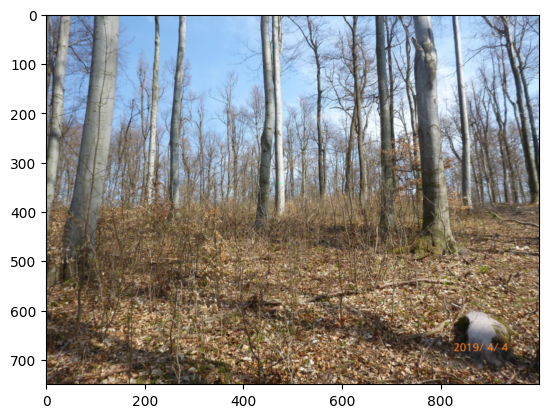

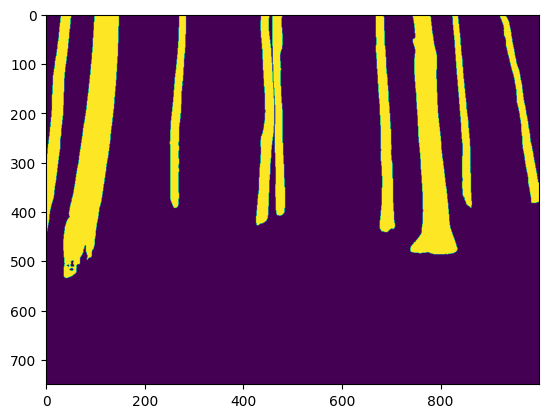

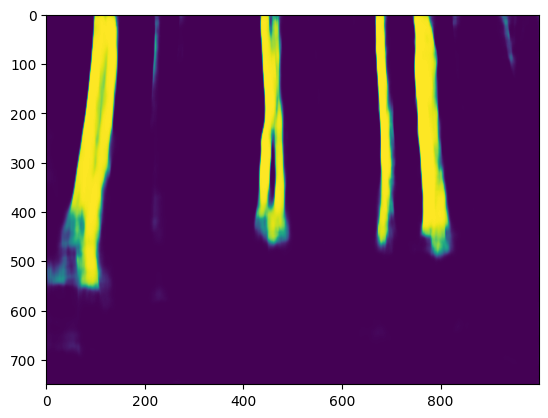

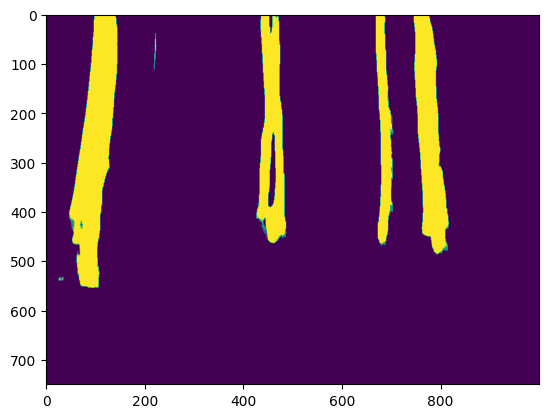

In [38]:
eval(4)

In [70]:
def plotter(num):
    import matplotlib.pyplot as plt

    num_images_per_row = 5
    # Calculate the number of rows needed
    num_rows = (num + num_images_per_row - 1) // num_images_per_row

    # Increase the plot size
    fig, axs = plt.subplots(num_rows * 2, num_images_per_row, figsize=(20, 8 * num_rows))

    for i, idx in enumerate(range(num)):
        input_image = val_dataset[idx][0].detach().cpu().numpy()
        pred = unet(val_dataset[idx][0].cuda().unsqueeze(0)).detach().cpu().numpy()
        bin_pred = (pred > 0.65).astype(int)[0]

        # Determine the row for plotting
        row = i // num_images_per_row

        # Calculate the column index within the current row
        col = i % num_images_per_row

        # Plot in the appropriate subplot
        axs[row * 2, col].imshow(np.transpose(input_image, [1, 2, 0]))
        axs[row * 2, col].set_title(f"Image {idx}")
        axs[row * 2, col].axis('off')

        axs[row * 2 + 1, col].imshow(np.transpose(bin_pred, (1, 2, 0)))
        axs[row * 2 + 1, col].set_title(f"Binary Prediction {idx}")
        axs[row * 2 + 1, col].axis('off')

    plt.tight_layout()
    plt.show()


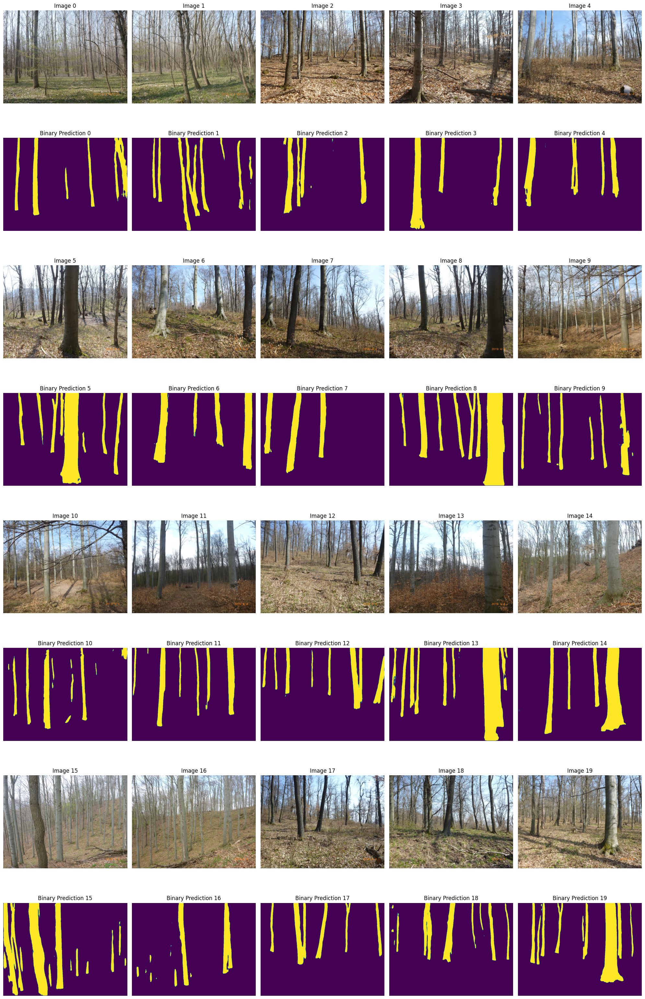

In [71]:
plotter(20)

In [72]:
predictions, results = unet.predict(val_loader, device=device)

In [73]:
torch.save(unet.state_dict(), 'unet_model_semifinal.pth')

In [ ]:
path = "path"
unet.load_state_dict(torch.load(path, map_location=device))